# Introduction

- **session_id** - the ID of the session the event took place in
- **index** - the index of the event for the session
- **elapsed_time** - how much time has passed (in milliseconds) between the start of the session and when the event was recorded
- **event_name** - the name of the event type
- **name** - the event name (e.g. identifies whether a notebook_click is opening or closing the notebook)
- **level** - what level of the game the event occurred in (0 to 22)
- **page** - the page number of the event (only for notebook-related events)
- **room_coor_x** - the coordinates of the click in reference to the in-game room (only for click events)
- **room_coor_y** - the coordinates of the click in reference to the in-game room (only for click events)
- **screen_coor_x** - the coordinates of the click in reference to the player’s screen (only for click events)
- **screen_coor_y** - the coordinates of the click in reference to the player’s screen (only for click events)
- **hover_duration** - how long (in milliseconds) the hover happened for (only for hover events)
- **text** - the text the player sees during this event
- **fqid** - the fully qualified ID of the event
- **room_fqid** - the fully qualified ID of the room the event took place in
- **text_fqid** - the fully qualified ID of the
- **fullscreen** - whether the player is in fullscreen mode
- **hq** - whether the game is in high-quality
- **music** - whether the game music is on or off
- **level_group** - which group of levels - and group of questions - this row belongs to (0-4, 5-12, 13-22)

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Train

## Data

In [3]:
# Reference: https://www.kaggle.com/competitions/predict-student-performance-from-game-play/discussion/384359
dtypes={
    'elapsed_time': np.int32,
    'event_name': 'category',
    'name': 'category',
    'level': np.uint8,
    'room_coor_x': np.float32,
    'room_coor_y': np.float32,
    'screen_coor_x': np.float32,
    'screen_coor_y': np.float32,
    'hover_duration': np.float32,
    'text': 'category',
    'fqid': 'category',
    'room_fqid': 'category',
    'text_fqid': 'category',
    'fullscreen': 'category',
    'hq': 'category',
    'music': 'category',
    'level_group': 'category'
}

train_data = pd.read_csv('../data/train.csv', dtype=dtypes)

In [4]:
## Reference: https://www.kaggle.com/code/kimtaehun/lightgbm-baseline-with-aggregated-log-data?scriptVersionId=118573291&cellId=15
def summarize_data_info(df: pd.DataFrame) -> pd.DataFrame:
    summary = pd.DataFrame(df.dtypes, columns=['data_type'])
    
    summary['perc_missing'] = df.isnull().sum().values * 100
    summary['perc_missing'] = df.isnull().sum().values / len(df)
    summary['n_unique'] = df.nunique().values
    
    summary['first_value'] = df.loc[0].values
    summary['second_value'] = df.loc[1].values
    summary['third_value'] = df.loc[2].values
    
    df_describe = pd.DataFrame(df.describe(include='all').transpose())
    summary['min'] = df_describe['min'].values
    summary['max'] = df_describe['max'].values
    
    print(f'Data Shape: {df.shape}')
    
    return summary

In [5]:
summary = summarize_data_info(train_data)
summary

Data Shape: (26296946, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.000000,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int64,0.000000,20348,0,1,2,0.0,20473.0
elapsed_time,int32,0.000000,5042639,0,1323,831,0.0,1988606704.0
event_name,category,0.000000,11,cutscene_click,person_click,person_click,NaN,NaN
name,category,0.000000,6,basic,basic,basic,NaN,NaN
level,uint8,0.000000,23,0,0,0,0.0,22.0
page,float64,0.978532,7,NaN,NaN,NaN,0.0,6.0
room_coor_x,float32,0.078841,12538215,-413.991394,-413.991394,-413.991394,-1992.354614,1261.773804
room_coor_y,float32,0.078841,9551136,-159.314682,-159.314682,-159.314682,-918.162354,543.616394
screen_coor_x,float32,0.078841,57477,380.0,380.0,380.0,0.0,1919.0


In [6]:
# Reduce Memory Usage
# reference : https://www.kaggle.com/code/arjanso/reducing-dataframe-memory-size-by-65 @ARJANGROEN

def reduce_memory_usage(df):
    
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype.name
        if ((col_type != 'datetime64[ns]') & (col_type != 'category')):
            if (col_type != 'object'):
                c_min = df[col].min()
                c_max = df[col].max()

                if str(col_type)[:3] == 'int':
                    if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                        df[col] = df[col].astype(np.int8)
                    elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                        df[col] = df[col].astype(np.int16)
                    elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                        df[col] = df[col].astype(np.int32)
                    elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                        df[col] = df[col].astype(np.int64)

                else:
                    if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                        df[col] = df[col].astype(np.float16)
                    elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                        df[col] = df[col].astype(np.float32)
                    else:
                        pass
            else:
                df[col] = df[col].astype('category')
    mem_usg = df.memory_usage().sum() / 1024**2 
    print("Memory usage became: ",mem_usg," MB")
    
    return df

In [7]:
train_data = reduce_memory_usage(train_data)

Memory usage of dataframe is 1529.83 MB
Memory usage became:  1053.3384094238281  MB


In [8]:
summary = summarize_data_info(train_data)
summary

Data Shape: (26296946, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.000000,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.000000,20348,0,1,2,0.0,20473.0
elapsed_time,int32,0.000000,5042639,0,1323,831,0.0,1988606704.0
event_name,category,0.000000,11,cutscene_click,person_click,person_click,NaN,NaN
name,category,0.000000,6,basic,basic,basic,NaN,NaN
level,float16,0.000000,23,0.0,0.0,0.0,0.0,22.0
page,float16,0.978532,7,NaN,NaN,NaN,0.0,6.0
room_coor_x,float16,0.078841,29854,-414.0,-414.0,-414.0,-1992.0,1262.0
room_coor_y,float16,0.078841,27847,-159.375,-159.375,-159.375,-918.0,543.5
screen_coor_x,float16,0.078841,6866,380.0,380.0,380.0,0.0,1919.0


### `Text` Field Preprocessing

In [9]:
from typing import Dict

def preprocess_text_str(text_str: str) -> str:
    s = str(text_str).replace("\\", "")
    text_str_ = "undefined" if s.startswith("u0") or (s in ["undefined", "nan"]) else s
    
    text_str__clean = text_str_.split("u0")[0] if "u0" in text_str_ else text_str_ 
    
    return text_str__clean

def create_text_field__clean_dict(data: pd.DataFrame(), text_field: str) -> Dict:
    text_values = list(data[text_field].unique())
    text_values_ = [preprocess_text_str(s) for s in text_values]
    
    text_field__clean_dict = dict(zip(text_values, text_values_))
    
    return text_field__clean_dict

def map_text_field(data: pd.DataFrame, text_field: str, text_field__clean_dict: Dict) -> pd.DataFrame:
    data[text_field] = data[text_field].map(text_values__clean_dict).fillna("undefined")
    
    return data

def recategorize_category_typed_fields(data: pd.DataFrame) -> pd.DataFrame:
    for field_name, dtype in data.dtypes.items():
        if dtype == "category":
            data[field_name] = data[field_name].astype(str).astype("category")
            
    return data

In [10]:
text_values = list(train_data["text"].unique())
text_values[:20]

['undefined',
 'Whatcha doing over there, Jo?',
 'Just talking to Teddy.',
 'I gotta run to my meeting!',
 'Can I come, Gramps?',
 'Sure thing, Jo. Grab your notebook and come upstairs!',
 'See you later, Teddy.',
 "I get to go to Gramps's meeting!",
 'Now where did I put my notebook?',
 '\\u00f0\\u0178\\u02dc\\u00b4',
 nan,
 'I love these photos of me and Teddy!',
 'Found it!',
 'Gramps is in trouble for losing papers?',
 "This can't be right!",
 'Gramps is a great historian!',
 "Hmm. Button's still not working.",
 "Let's get started. The Wisconsin Wonders exhibit opens tomorrow!",
 'Who wants to investigate the shirt artifact?',
 "Not Leopold here. He's been losing papers lately."]

In [11]:
text_values_ = [preprocess_text_str(s) for s in text_values]
text_values_[:20]

['undefined',
 'Whatcha doing over there, Jo?',
 'Just talking to Teddy.',
 'I gotta run to my meeting!',
 'Can I come, Gramps?',
 'Sure thing, Jo. Grab your notebook and come upstairs!',
 'See you later, Teddy.',
 "I get to go to Gramps's meeting!",
 'Now where did I put my notebook?',
 'undefined',
 'undefined',
 'I love these photos of me and Teddy!',
 'Found it!',
 'Gramps is in trouble for losing papers?',
 "This can't be right!",
 'Gramps is a great historian!',
 "Hmm. Button's still not working.",
 "Let's get started. The Wisconsin Wonders exhibit opens tomorrow!",
 'Who wants to investigate the shirt artifact?',
 "Not Leopold here. He's been losing papers lately."]

In [12]:
text_field__clean_dict = dict(zip(text_values, text_values_))
train_data["text"] = train_data["text"].map(text_field__clean_dict).fillna("undefined").astype('category')

In [13]:
summary = summarize_data_info(train_data)
summary

Data Shape: (26296946, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.000000,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.000000,20348,0,1,2,0.0,20473.0
elapsed_time,int32,0.000000,5042639,0,1323,831,0.0,1988606704.0
event_name,category,0.000000,11,cutscene_click,person_click,person_click,NaN,NaN
name,category,0.000000,6,basic,basic,basic,NaN,NaN
level,float16,0.000000,23,0.0,0.0,0.0,0.0,22.0
page,float16,0.978532,7,NaN,NaN,NaN,0.0,6.0
room_coor_x,float16,0.078841,29854,-414.0,-414.0,-414.0,-1992.0,1262.0
room_coor_y,float16,0.078841,27847,-159.375,-159.375,-159.375,-918.0,543.5
screen_coor_x,float16,0.078841,6866,380.0,380.0,380.0,0.0,1919.0


### Train Labels

In [14]:
train_labels = pd.read_csv("../data/train_labels.csv")

In [15]:
summary = summarize_data_info(train_labels)
summary

Data Shape: (424116, 2)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,object,0.0,424116,20090312431273200_q1,20090312433251036_q1,20090312455206810_q1,NaN,NaN
correct,int64,0.0,2,1,0,1,0.0,1.0


In [16]:
train_labels['question_no'] = train_labels['session_id'].apply(lambda x: int(x.split('_')[-1][1:]))
train_labels['session_id'] = train_labels['session_id'].apply(lambda x: int(x.split('_')[0]) )

train_labels["session_id"].nunique()

23562

In [17]:
summary = summarize_data_info(train_labels)
summary

Data Shape: (424116, 3)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,23562,20090312431273200,20090312433251036,20090312455206810,2.009031e+16,2.210022e+16
correct,int64,0.0,2,1,0,1,0.000000e+00,1.000000e+00
question_no,int64,0.0,18,1,1,1,1.000000e+00,1.800000e+01


#### Validity check >>> Train Labels

In [18]:
train_labels.groupby("session_id")["question_no"].nunique().value_counts()

18    23562
Name: question_no, dtype: int64

In [19]:
question_no__list = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]
len(train_labels[~train_labels["question_no"].isin(question_no__list)])

0

In [20]:
len(train_labels) == (23562 * 18)

True

#### Validity check >>> Session ids in datasets

In [21]:
train_data__session_id_unique_vals = train_data["session_id"].drop_duplicates().sort_values().reset_index(drop=True)
train_labels__session_id_unique_vals = train_labels["session_id"].drop_duplicates().sort_values().reset_index(drop=True)

pd.testing.assert_series_equal(train_data__session_id_unique_vals, train_labels__session_id_unique_vals)

### Downsampling

In [22]:
session_ids = sorted(train_labels["session_id"].unique())

np.random.seed(42)
np.random.shuffle(session_ids)

session_ids[:5]

[22010107585684490,
 20100413373831344,
 21000409261644490,
 20110314164224844,
 21080621495509370]

In [23]:
N_CHUNKS = 10

np.random.seed(42)
chunk_ids = np.random.randint(N_CHUNKS, size=len(session_ids))

session_chunk_df = pd.DataFrame({"session_id": session_ids, "chunk_id": chunk_ids})
session_chunk_df["chunk_id"].value_counts()

0    2418
9    2407
5    2395
6    2360
1    2358
2    2350
3    2347
7    2320
8    2311
4    2296
Name: chunk_id, dtype: int64

In [24]:
session_chunk_df["chunk_id"].nunique()

10

## Filter Data

### `level_group` == `"13-22"`

In [25]:
level_group = "13-22"
train_data__lg_filtered = train_data[train_data["level_group"] == level_group].drop(labels="level_group", axis=1).reset_index(drop=True)
train_data__lg_filtered.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music
0,20090312431273200,512,836732,navigate_click,undefined,13.0,NaN,290.25,-204.500,651.0,445.0,NaN,undefined,NaN,tunic.capitol_1.hall,NaN,0,0,1
1,20090312431273200,513,837245,navigate_click,undefined,13.0,NaN,353.75,-210.375,672.0,445.0,NaN,undefined,NaN,tunic.capitol_1.hall,NaN,0,0,1
2,20090312431273200,514,837779,navigate_click,undefined,13.0,NaN,587.50,-280.750,780.0,489.0,NaN,undefined,NaN,tunic.capitol_1.hall,NaN,0,0,1
3,20090312431273200,515,838446,navigate_click,undefined,13.0,NaN,751.50,-102.125,823.0,365.0,NaN,undefined,toentry,tunic.capitol_1.hall,NaN,0,0,1
4,20090312431273200,516,839629,map_hover,basic,13.0,NaN,NaN,NaN,NaN,NaN,67.0,undefined,tunic.drycleaner,tunic.capitol_1.hall,NaN,0,0,1


In [26]:
summary = summarize_data_info(train_data__lg_filtered)
summary

Data Shape: (13471703, 19)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.000000,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.000000,7903,512,513,514,0.0,20473.0
elapsed_time,int32,0.000000,4191241,836732,837245,837779,0.0,1988606704.0
event_name,category,0.000000,11,navigate_click,navigate_click,navigate_click,NaN,NaN
name,category,0.000000,6,undefined,undefined,undefined,NaN,NaN
level,float16,0.000000,10,13.0,13.0,13.0,13.0,22.0
page,float16,0.977682,7,NaN,NaN,NaN,0.0,6.0
room_coor_x,float16,0.076173,27566,290.25,353.75,587.5,-1992.0,1262.0
room_coor_y,float16,0.076173,26407,-204.5,-210.375,-280.75,-918.0,543.5
screen_coor_x,float16,0.076173,6552,651.0,672.0,780.0,0.0,1919.0


#### `question_no` == `1`

In [27]:
question_no = 1
train_labels__qn_filtered = train_labels[train_labels["question_no"] == question_no].drop(labels="question_no", axis=1).reset_index(drop=True)
train_labels__qn_filtered.head()

,session_id,correct
0,20090312431273200,1
1,20090312433251036,0
2,20090312455206810,1
3,20090313091715820,0
4,20090313571836404,1


In [28]:
summary = summarize_data_info(train_labels__qn_filtered)
summary

Data Shape: (23562, 2)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,23562,20090312431273200,20090312433251036,20090312455206810,2.009031e+16,2.210022e+16
correct,int64,0.0,2,1,0,1,0.000000e+00,1.000000e+00


# EDA per Event

In [29]:
df = train_data__lg_filtered.merge(train_labels__qn_filtered, on="session_id", how="left")
df.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,512,836732,navigate_click,undefined,13.0,NaN,290.25,-204.500,651.0,445.0,NaN,undefined,NaN,tunic.capitol_1.hall,NaN,0,0,1,1
1,20090312431273200,513,837245,navigate_click,undefined,13.0,NaN,353.75,-210.375,672.0,445.0,NaN,undefined,NaN,tunic.capitol_1.hall,NaN,0,0,1,1
2,20090312431273200,514,837779,navigate_click,undefined,13.0,NaN,587.50,-280.750,780.0,489.0,NaN,undefined,NaN,tunic.capitol_1.hall,NaN,0,0,1,1
3,20090312431273200,515,838446,navigate_click,undefined,13.0,NaN,751.50,-102.125,823.0,365.0,NaN,undefined,toentry,tunic.capitol_1.hall,NaN,0,0,1,1
4,20090312431273200,516,839629,map_hover,basic,13.0,NaN,NaN,NaN,NaN,NaN,67.0,undefined,tunic.drycleaner,tunic.capitol_1.hall,NaN,0,0,1,1


In [30]:
summary = summarize_data_info(df)
summary

Data Shape: (13471703, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.000000,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.000000,7903,512,513,514,0.0,20473.0
elapsed_time,int32,0.000000,4191241,836732,837245,837779,0.0,1988606704.0
event_name,category,0.000000,11,navigate_click,navigate_click,navigate_click,NaN,NaN
name,category,0.000000,6,undefined,undefined,undefined,NaN,NaN
level,float16,0.000000,10,13.0,13.0,13.0,13.0,22.0
page,float16,0.977682,7,NaN,NaN,NaN,0.0,6.0
room_coor_x,float16,0.076173,27566,290.25,353.75,587.5,-1992.0,1262.0
room_coor_y,float16,0.076173,26407,-204.5,-210.375,-280.75,-918.0,543.5
screen_coor_x,float16,0.076173,6552,651.0,672.0,780.0,0.0,1919.0


In [31]:
from typing import List, Tuple

def get_heatmap_values(df: pd.DataFrame, col_pair: List[str]) -> pd.DataFrame:
    df__col_pair = df[[*col_pair, "correct"]]

    subcount_df = df__col_pair.groupby([*col_pair, "correct"]).size().reset_index().rename(columns={0: "subcount"})
    count_df = df__col_pair.groupby(col_pair).size().reset_index().rename(columns={0: "count"})

    df__all_counts = subcount_df.merge(count_df, on=col_pair, how="left")
    df__all_counts["perc"] = df__all_counts["subcount"] / df__all_counts["count"]

    df__heatmap = df__all_counts[df__all_counts["correct"] == 1].pivot_table(index=col_pair[0], columns=col_pair[1], values="perc")
    df__heatmap = df__heatmap.sort_values(by=df__heatmap.columns.to_list())

    return df__heatmap

def plot_heatmap(df__heatmap: pd.DataFrame, figsize: Tuple[int] = (12, 12)):
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(df__heatmap, annot=True, cbar=False, ax=ax)
    
    plt.show()

## Event Categories

In [32]:
for i in df["event_name"].unique().categories:
    print(i)

checkpoint
cutscene_click
map_click
map_hover
navigate_click
notebook_click
notification_click
object_click
object_hover
observation_click
person_click


## `event_name` == `"checkpoint"`

In [33]:
df__checkpoint = df[df["event_name"] == "checkpoint"].reset_index(drop=True)
df__checkpoint.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,931,1272679,checkpoint,basic,22.0,NaN,NaN,NaN,NaN,NaN,NaN,undefined,chap4_finale_c,tunic.capitol_2.hall,NaN,0,0,1,1
1,20090312433251036,1875,3815334,checkpoint,basic,22.0,NaN,NaN,NaN,NaN,NaN,NaN,undefined,chap4_finale_c,tunic.capitol_2.hall,NaN,0,0,0,0
2,20090312455206810,826,1189050,checkpoint,basic,22.0,NaN,NaN,NaN,NaN,NaN,NaN,undefined,chap4_finale_c,tunic.capitol_2.hall,NaN,1,1,1,1
3,20090313091715820,1039,1621368,checkpoint,basic,22.0,NaN,NaN,NaN,NaN,NaN,NaN,undefined,chap4_finale_c,tunic.capitol_2.hall,NaN,1,1,1,0
4,20090313571836404,783,1174676,checkpoint,basic,22.0,NaN,NaN,NaN,NaN,NaN,NaN,undefined,chap4_finale_c,tunic.capitol_2.hall,NaN,0,0,1,1


#### Update Category Fields

In [34]:
df__checkpoint = recategorize_category_typed_fields(df__checkpoint)

In [35]:
summary = summarize_data_info(df__checkpoint)
summary

Data Shape: (23633, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,23562,20090312431273200,20090312433251036,20090312455206810,20090312431273200.0,22100221145014656.0
index,int16,0.0,1869,931,1875,826,0.0,20473.0
elapsed_time,int32,0.0,23548,1272679,3815334,1189050,300.0,1468325947.0
event_name,category,0.0,1,checkpoint,checkpoint,checkpoint,NaN,NaN
name,category,0.0,1,basic,basic,basic,NaN,NaN
level,float16,0.0,1,22.0,22.0,22.0,22.0,22.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_y,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
screen_coor_x,float16,1.0,0,NaN,NaN,NaN,NaN,NaN


#### Insights

- `name` field is constant (basic).
- `level` field is constant (22).
- `text` field is constant (undefined).
- `fqid` field is constant (chap4_finale_c).
- `room_fqid` field is constant (tunic.capitol_2.hall).
- `text_fqid` field is constant (nan).
- **NULL FIELDS**:
    - `page`
    - `room_coor_x`
    - `room_coor_y`
    - `screen_coor_x`
    - `screen_coor_y`
    - `hover_duration`

## `event_name` == `"cutscene_click"`

In [36]:
df__cutscene_click = df[df["event_name"] == "cutscene_click"].reset_index(drop=True)
df__cutscene_click.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,523,844329,cutscene_click,basic,13.0,NaN,-50.5625,-43.3750,509.0,360.0,NaN,Jo!,ch3start,tunic.historicalsociety.basement,tunic.historicalsociety.basement.ch3start,0,0,1,1
1,20090312431273200,524,845479,cutscene_click,basic,13.0,NaN,119.9375,-124.8125,635.0,420.0,NaN,Check out the next artifact!,ch3start,tunic.historicalsociety.basement,tunic.historicalsociety.basement.ch3start,0,0,1,1
2,20090312431273200,525,848147,cutscene_click,basic,13.0,NaN,147.5000,-135.2500,495.0,420.0,NaN,What is it?,ch3start,tunic.historicalsociety.basement,tunic.historicalsociety.basement.ch3start,0,0,1,1
3,20090312431273200,526,848745,cutscene_click,basic,13.0,NaN,164.6250,-135.3750,494.0,420.0,NaN,"I think it's a flag! Pretty interesting, huh?",ch3start,tunic.historicalsociety.basement,tunic.historicalsociety.basement.ch3start,0,0,1,1
4,20090312431273200,527,849311,cutscene_click,basic,13.0,NaN,169.1250,-136.7500,493.0,421.0,NaN,"It's really cool, Gramps. But I'm worried abou...",ch3start,tunic.historicalsociety.basement,tunic.historicalsociety.basement.ch3start,0,0,1,1


#### Update Category Fields

In [37]:
df__cutscene_click = recategorize_category_typed_fields(df__cutscene_click)

In [38]:
summary = summarize_data_info(df__cutscene_click)
summary

Data Shape: (1623072, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.0,3296,523,524,525,0.0,19407.0
elapsed_time,int32,0.0,1141780,844329,845479,848147,100.0,1988105886.0
event_name,category,0.0,1,cutscene_click,cutscene_click,cutscene_click,NaN,NaN
name,category,0.0,1,basic,basic,basic,NaN,NaN
level,float16,0.0,5,13.0,13.0,13.0,13.0,22.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,0.0,19645,-50.5625,119.9375,147.5,-1419.0,949.0
room_coor_y,float16,0.0,18398,-43.375,-124.8125,-135.25,-530.0,543.5
screen_coor_x,float16,0.0,3954,509.0,635.0,495.0,0.0,1886.0


#### Insights

- `name` field is constant (basic).
- **NULL FIELDS**:
    - `page`
    - `hover_duration`

#### Categorical Fields

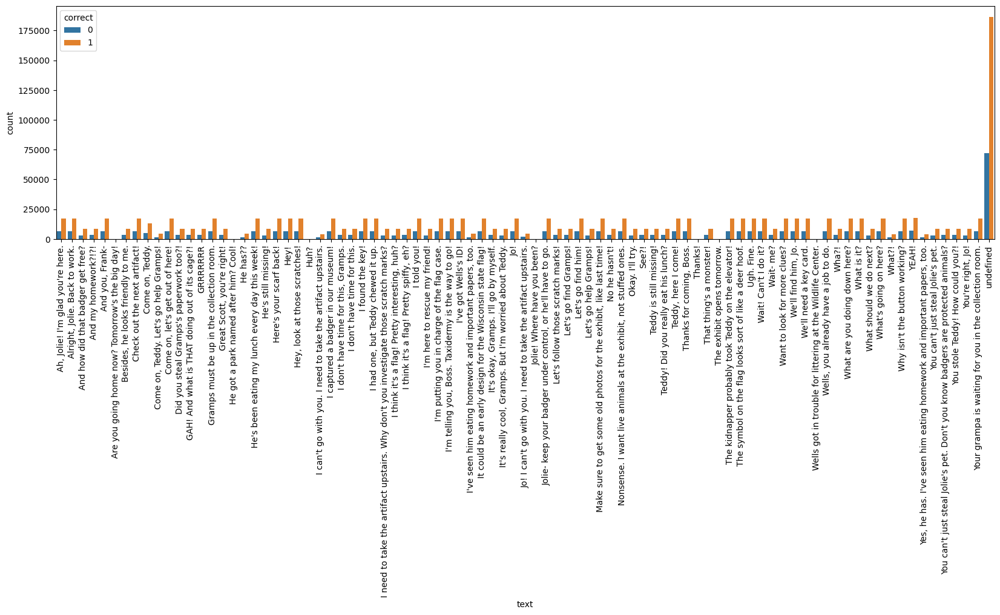

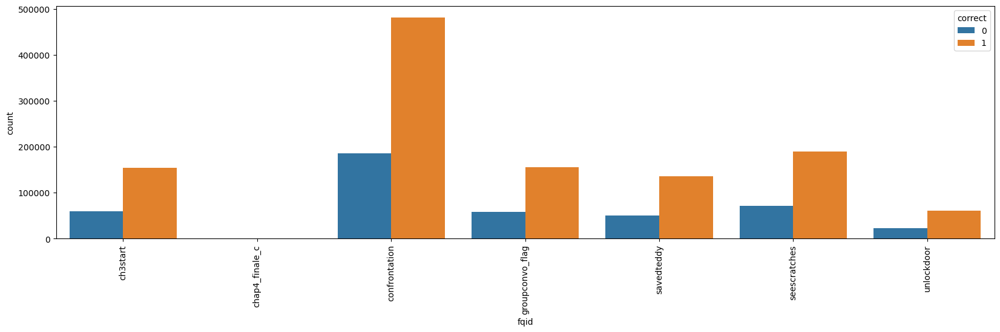

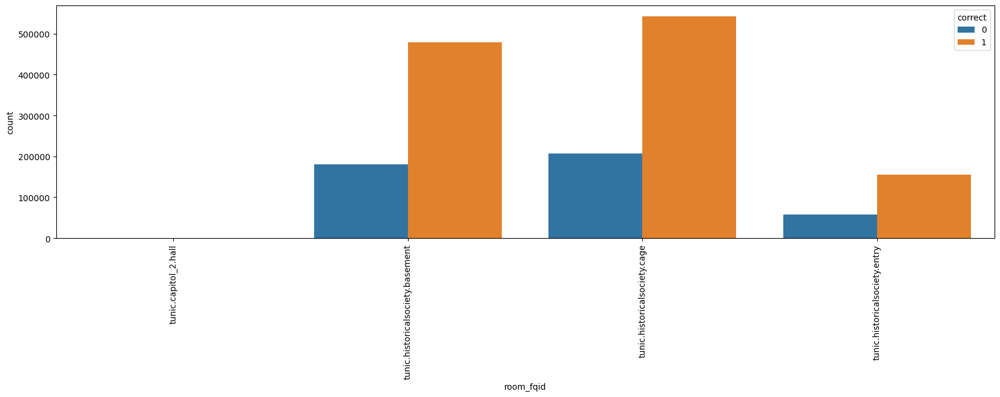

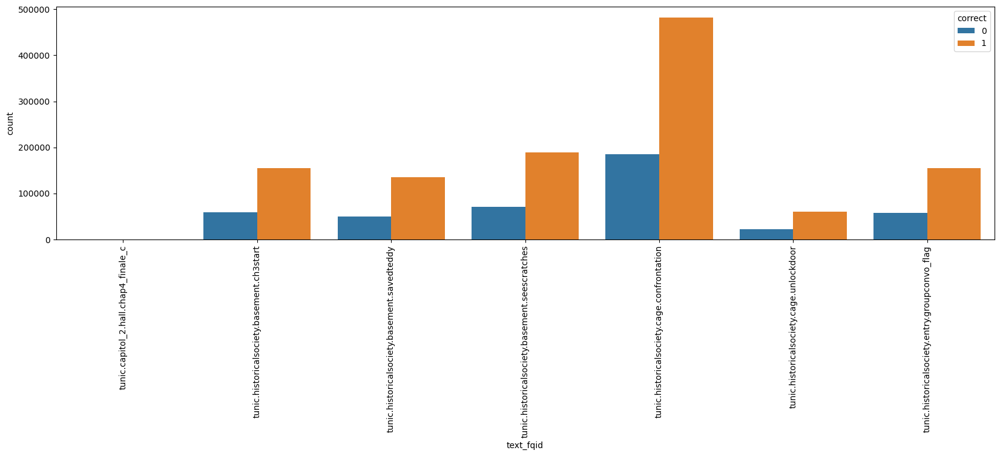

In [39]:
cat_fields_list = ["text", "fqid", "room_fqid", "text_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(20, 5))
    sns.countplot(data=df__cutscene_click, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

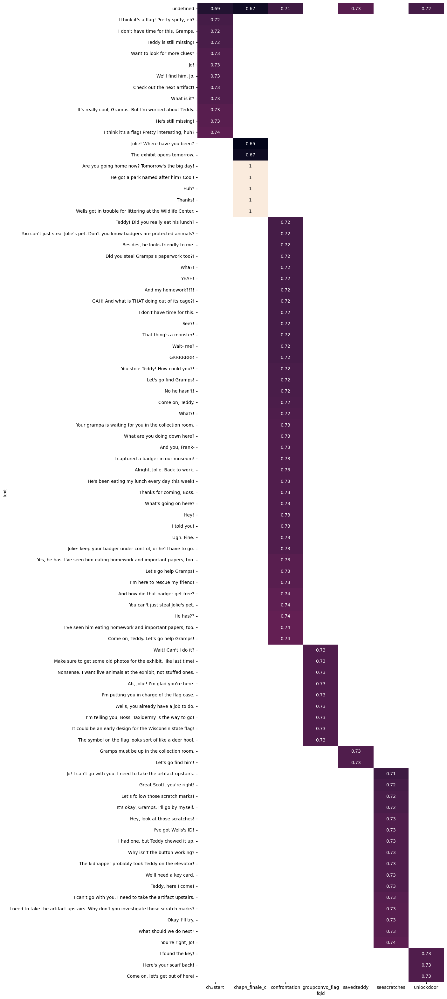

In [40]:
col_pair = ["text", "fqid"]
plot_heatmap(get_heatmap_values(df__cutscene_click, col_pair), figsize=(10, 40))

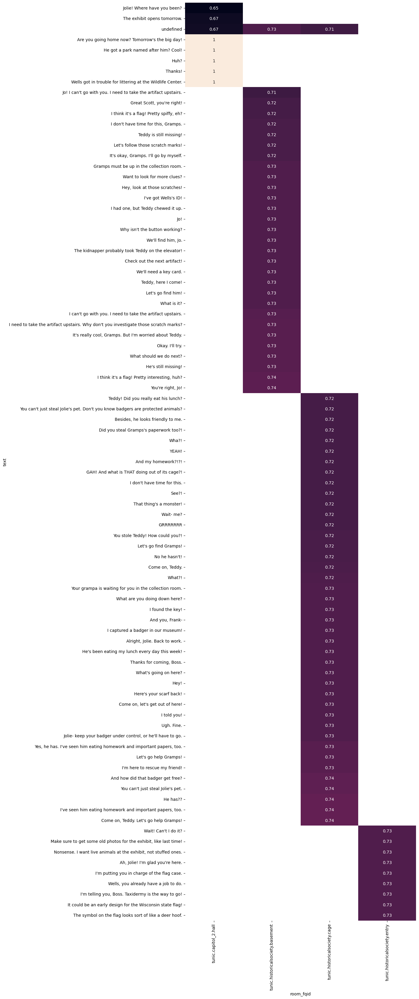

In [41]:
col_pair = ["text", "room_fqid"]
plot_heatmap(get_heatmap_values(df__cutscene_click, col_pair), figsize=(10, 40))

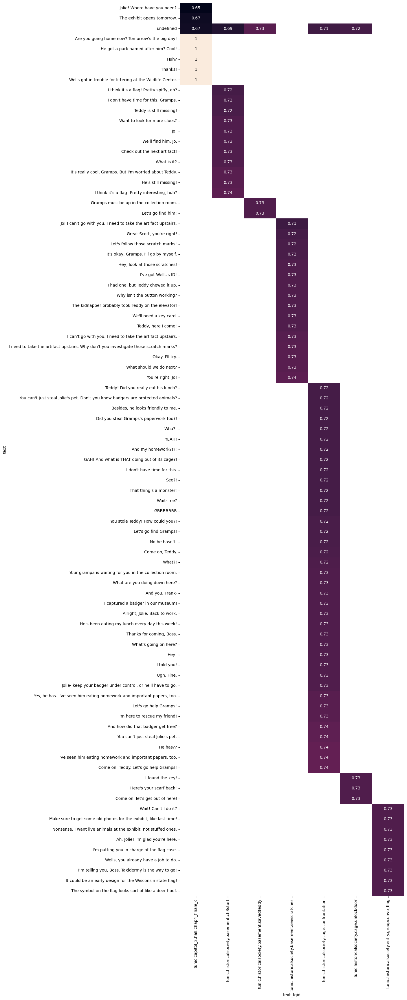

In [42]:
col_pair = ["text", "text_fqid"]
plot_heatmap(get_heatmap_values(df__cutscene_click, col_pair), figsize=(10, 40))

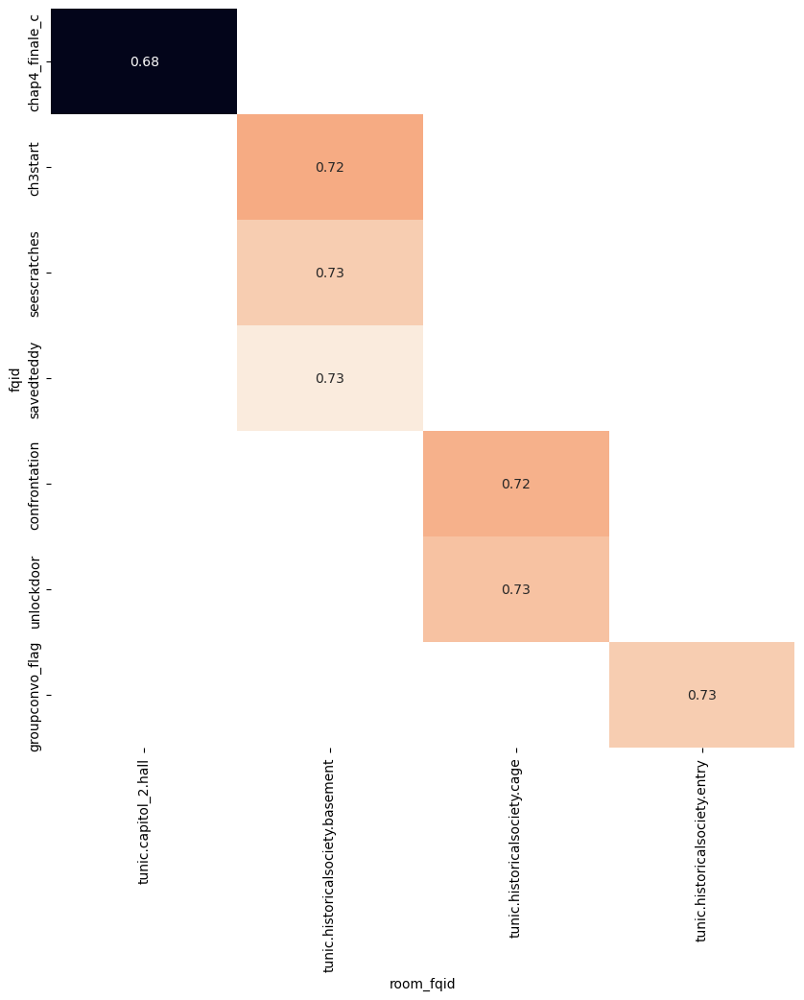

In [43]:
col_pair = ["fqid", "room_fqid"]
plot_heatmap(get_heatmap_values(df__cutscene_click, col_pair), figsize=(10, 10))

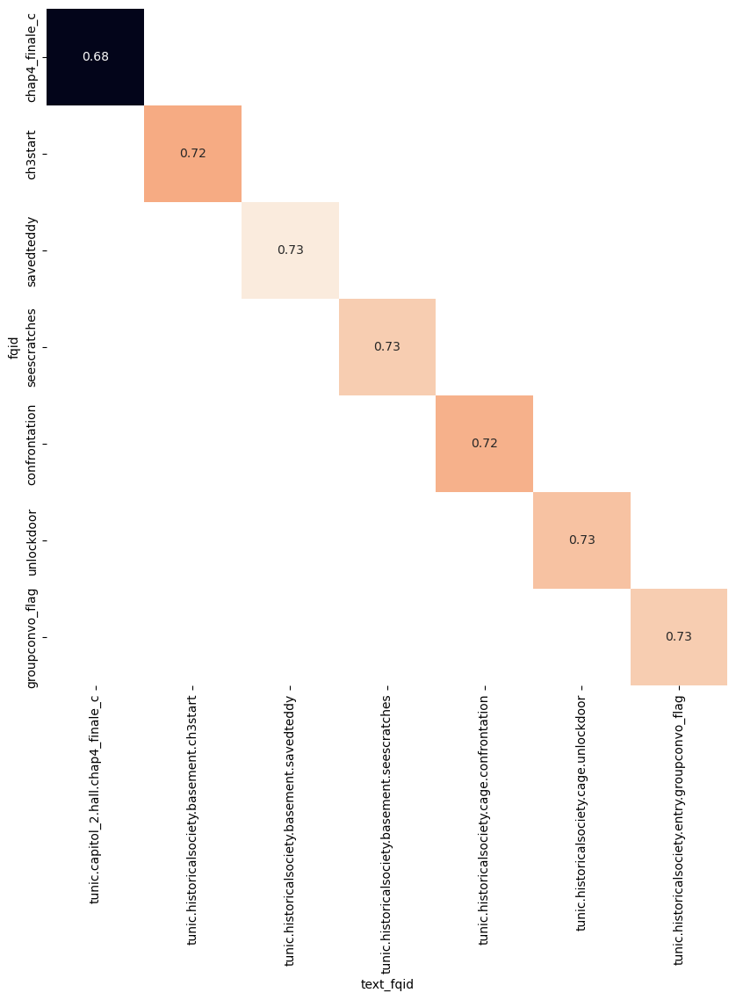

In [44]:
col_pair = ["fqid", "text_fqid"]
plot_heatmap(get_heatmap_values(df__cutscene_click, col_pair), figsize=(10, 10))

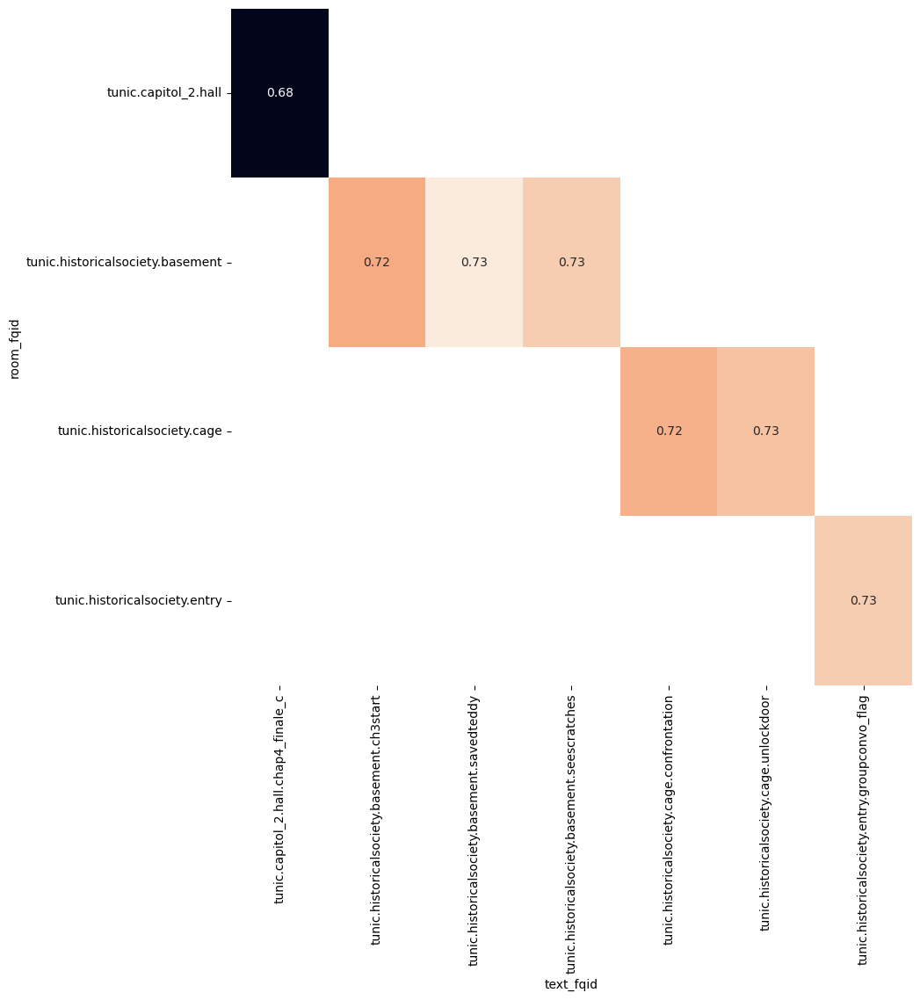

In [45]:
col_pair = ["room_fqid", "text_fqid"]
plot_heatmap(get_heatmap_values(df__cutscene_click, col_pair), figsize=(10, 10))

## `event_name` == `"map_click"`

In [46]:
df__map_click = df[df["event_name"] == "map_click"].reset_index(drop=True)
df__map_click.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,521,841512,map_click,undefined,13.0,NaN,431.75000,216.000000,541.0,166.0,NaN,undefined,tunic.historicalsociety,tunic.capitol_1.hall,NaN,0,0,1,1
1,20090312431273200,721,1044018,map_click,undefined,18.0,NaN,967.00000,-341.000000,753.0,539.0,NaN,undefined,tunic.wildlife,tunic.historicalsociety.entry,NaN,0,0,1,1
2,20090312431273200,825,1131795,map_click,undefined,19.0,NaN,417.50000,-340.250000,749.0,217.0,NaN,undefined,tunic.flaghouse,tunic.wildlife.center,NaN,0,0,1,1
3,20090312431273200,857,1159661,map_click,undefined,20.0,NaN,58.96875,24.390625,325.0,299.0,NaN,undefined,tunic.library,tunic.flaghouse.entry,NaN,0,0,1,1
4,20090312431273200,897,1233809,map_click,undefined,21.0,NaN,-275.25000,207.125000,534.0,171.0,NaN,undefined,tunic.historicalsociety,tunic.library.frontdesk,NaN,0,0,1,1


#### Update Category Fields

In [47]:
df__map_click = recategorize_category_typed_fields(df__map_click)

In [48]:
summary = summarize_data_info(df__map_click)
summary

Data Shape: (257860, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.0,3605,521,721,825,0.0,20470.0
elapsed_time,int32,0.0,246812,841512,1044018,1131795,248.0,1988601973.0
event_name,category,0.0,1,map_click,map_click,map_click,NaN,NaN
name,category,0.0,3,undefined,undefined,undefined,NaN,NaN
level,float16,0.0,10,13.0,18.0,19.0,13.0,22.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,0.0,12325,431.75,967.0,417.5,-998.0,1171.0
room_coor_y,float16,0.0,15479,216.0,-341.0,-340.25,-918.0,536.5
screen_coor_x,float16,0.0,2294,541.0,753.0,749.0,0.0,1872.0


In [49]:
df__map_click["name"].value_counts()

undefined    216558
basic         24696
close         16606
Name: name, dtype: int64

#### Insights

- `name` field has 3 different values (basic, undefined, close).
- `text` field is constant (undefined).
- `text_fqid` field is constant (nan).
- **NULL FIELDS**:
    - `page`
    - `hover_duration`

#### Categorical Fields

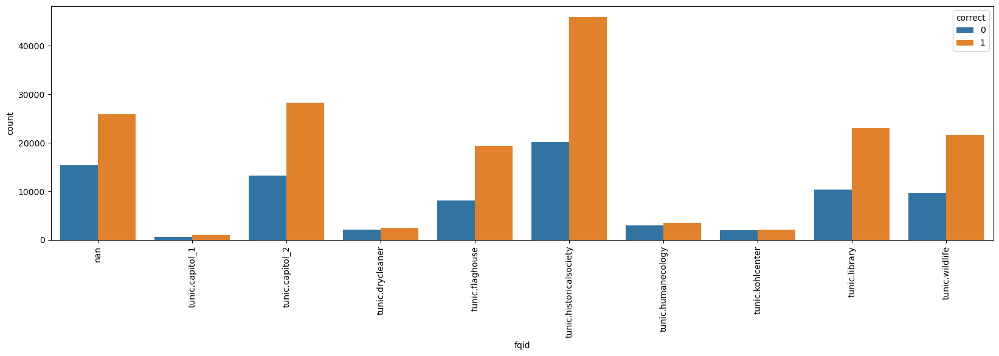

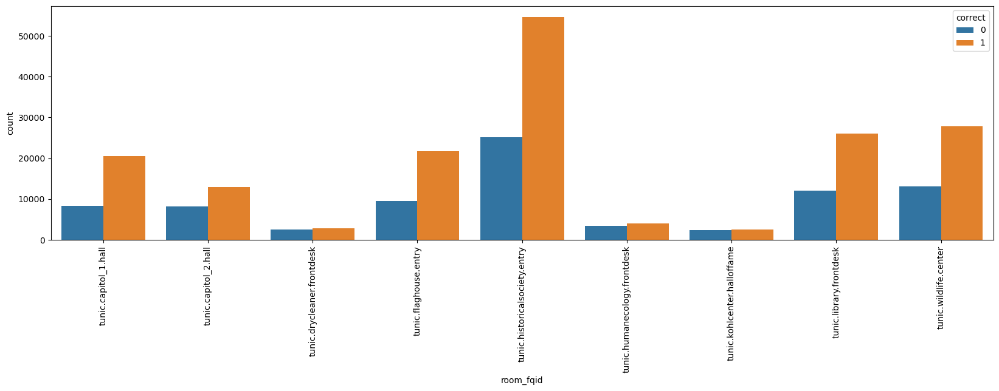

In [50]:
cat_fields_list = ["fqid", "room_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(20, 5))
    sns.countplot(data=df__map_click, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

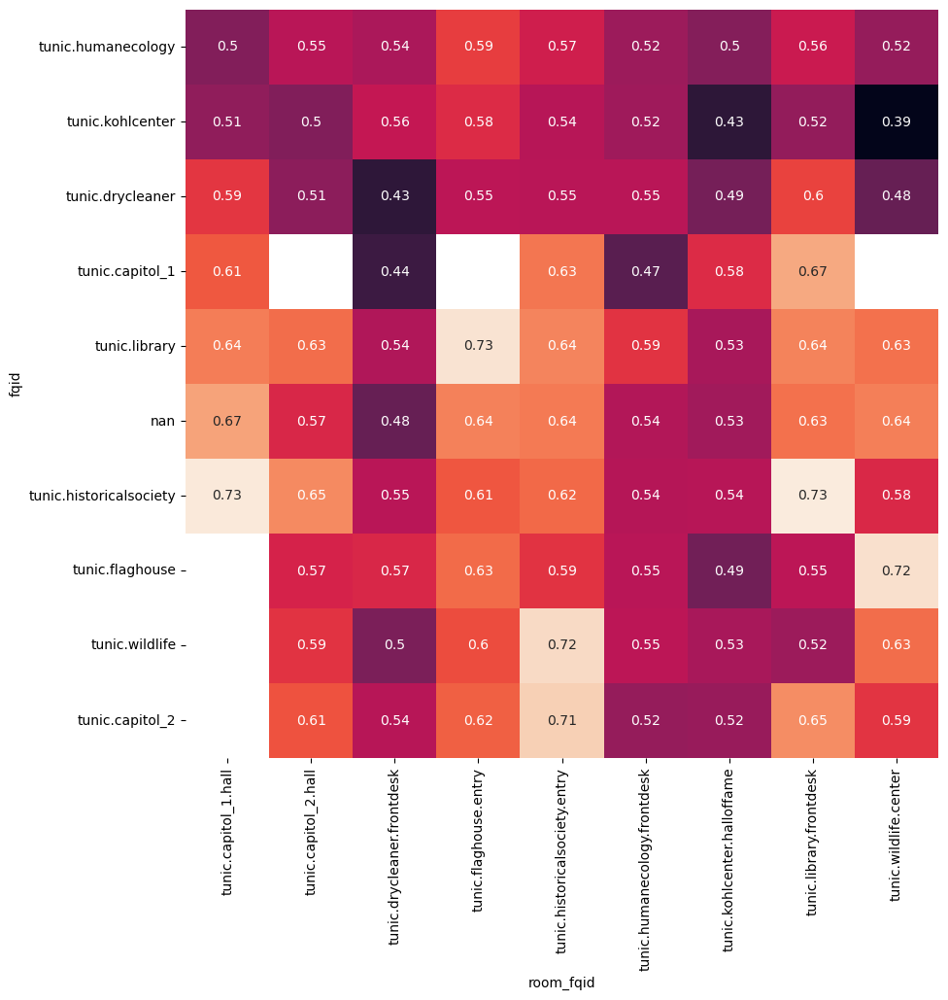

In [51]:
col_pair = ["fqid", "room_fqid"]
plot_heatmap(get_heatmap_values(df__map_click, col_pair), figsize=(10, 10))

## `event_name` == `"map_hover"`

In [52]:
df__map_hover = df[df["event_name"] == "map_hover"].reset_index(drop=True)
df__map_hover.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,516,839629,map_hover,basic,13.0,NaN,NaN,NaN,NaN,NaN,67.0,undefined,tunic.drycleaner,tunic.capitol_1.hall,NaN,0,0,1,1
1,20090312431273200,517,840662,map_hover,basic,13.0,NaN,NaN,NaN,NaN,NaN,983.0,undefined,tunic.drycleaner,tunic.capitol_1.hall,NaN,0,0,1,1
2,20090312431273200,518,840780,map_hover,basic,13.0,NaN,NaN,NaN,NaN,NaN,100.0,undefined,tunic.historicalsociety,tunic.capitol_1.hall,NaN,0,0,1,1
3,20090312431273200,519,840830,map_hover,basic,13.0,NaN,NaN,NaN,NaN,NaN,35.0,undefined,tunic.capitol_1,tunic.capitol_1.hall,NaN,0,0,1,1
4,20090312431273200,520,841212,map_hover,basic,13.0,NaN,NaN,NaN,NaN,NaN,367.0,undefined,tunic.library,tunic.capitol_1.hall,NaN,0,0,1,1


#### Update Category Fields

In [53]:
df__map_hover = recategorize_category_typed_fields(df__map_hover)

In [54]:
summary = summarize_data_info(df__map_hover)
summary

Data Shape: (576859, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,21688,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.0,3926,516,517,518,0.0,20469.0
elapsed_time,int32,0.0,526354,839629,840662,840780,195.0,1988601273.0
event_name,category,0.0,1,map_hover,map_hover,map_hover,NaN,NaN
name,category,0.0,1,basic,basic,basic,NaN,NaN
level,float16,0.0,10,13.0,13.0,13.0,13.0,22.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_y,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
screen_coor_x,float16,1.0,0,NaN,NaN,NaN,NaN,NaN


#### Insights

- `name` field is constant (basic).
- `text` field is constant (undefined).
- `text_fqid` field is constant (nan).
- **NULL FIELDS**:
    - `page`
    - `room_coor_x`
    - `room_coor_y`
    - `screen_coor_x`
    - `screen_coor_y`

#### Categorical Fields

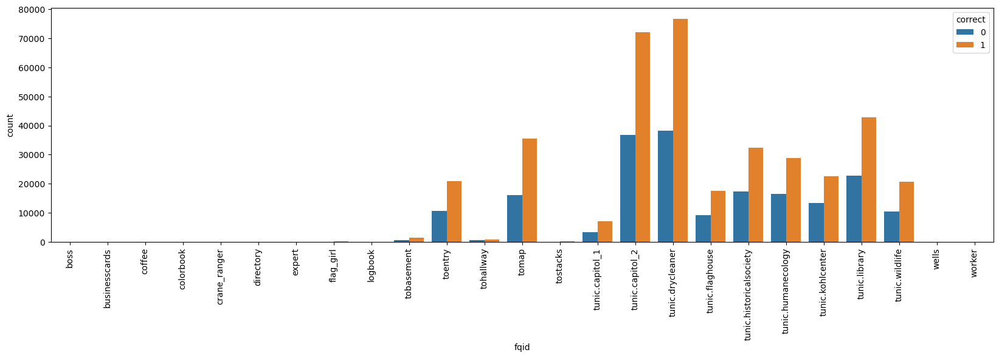

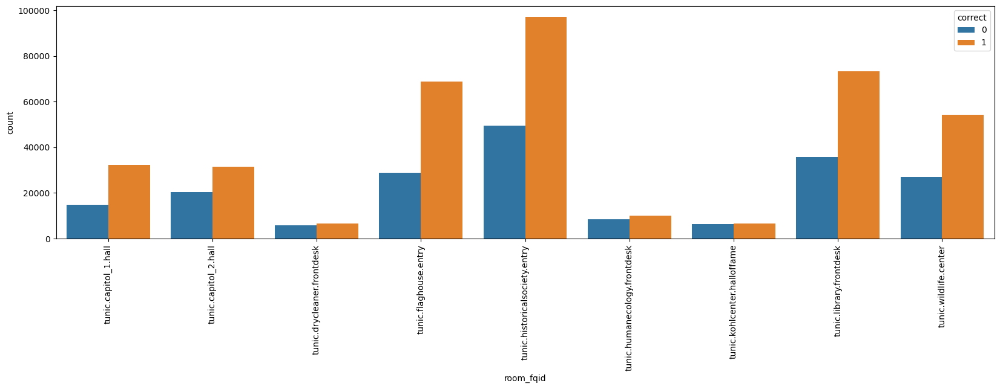

In [55]:
cat_fields_list = ["fqid", "room_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(20, 5))
    sns.countplot(data=df__map_hover, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

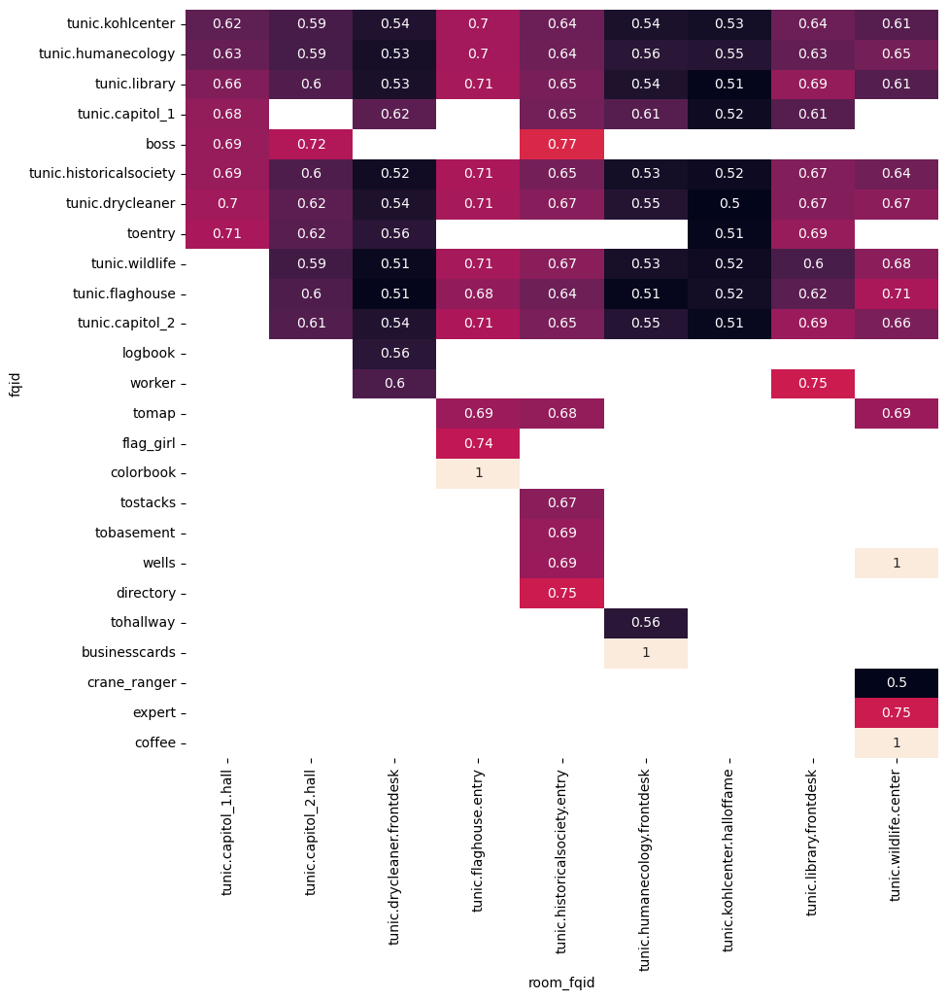

In [56]:
col_pair = ["fqid", "room_fqid"]
plot_heatmap(get_heatmap_values(df__map_hover, col_pair), figsize=(10, 10))

## `event_name` == `"navigate_click"`

In [57]:
df__navigate_click = df[df["event_name"] == "navigate_click"].reset_index(drop=True)
df__navigate_click.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,512,836732,navigate_click,undefined,13.0,NaN,290.25,-204.500,651.0,445.0,NaN,undefined,NaN,tunic.capitol_1.hall,NaN,0,0,1,1
1,20090312431273200,513,837245,navigate_click,undefined,13.0,NaN,353.75,-210.375,672.0,445.0,NaN,undefined,NaN,tunic.capitol_1.hall,NaN,0,0,1,1
2,20090312431273200,514,837779,navigate_click,undefined,13.0,NaN,587.50,-280.750,780.0,489.0,NaN,undefined,NaN,tunic.capitol_1.hall,NaN,0,0,1,1
3,20090312431273200,515,838446,navigate_click,undefined,13.0,NaN,751.50,-102.125,823.0,365.0,NaN,undefined,toentry,tunic.capitol_1.hall,NaN,0,0,1,1
4,20090312431273200,522,842396,navigate_click,undefined,13.0,NaN,593.00,170.375,523.0,223.0,NaN,undefined,tobasement,tunic.historicalsociety.entry,NaN,0,0,1,1


#### Update Category Fields

In [58]:
df__navigate_click = recategorize_category_typed_fields(df__navigate_click)

In [59]:
summary = summarize_data_info(df__navigate_click)
summary

Data Shape: (6326105, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.0,7354,512,513,514,0.0,20472.0
elapsed_time,int32,0.0,2910215,836732,837245,837779,0.0,1988606704.0
event_name,category,0.0,1,navigate_click,navigate_click,navigate_click,NaN,NaN
name,category,0.0,1,undefined,undefined,undefined,NaN,NaN
level,float16,0.0,10,13.0,13.0,13.0,13.0,22.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,0.0,26195,290.25,353.75,587.5,-1992.0,1259.0
room_coor_y,float16,0.0,24383,-204.5,-210.375,-280.75,-918.0,536.5
screen_coor_x,float16,0.0,6379,651.0,672.0,780.0,0.0,1919.0


#### Insights

- `name` field is constant (undefined).
- `text` field is constant (undefined).
- `text_fqid` field is constant (nan).
- **NULL FIELDS**:
    - `page`
    - `hover_duration`

#### Categorical Fields

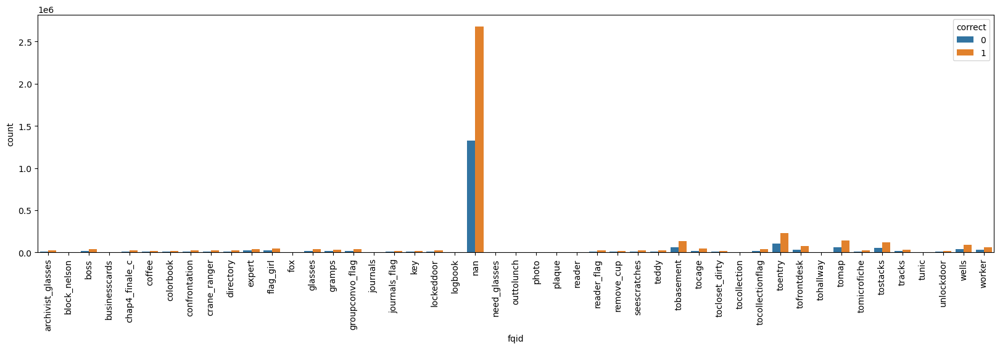

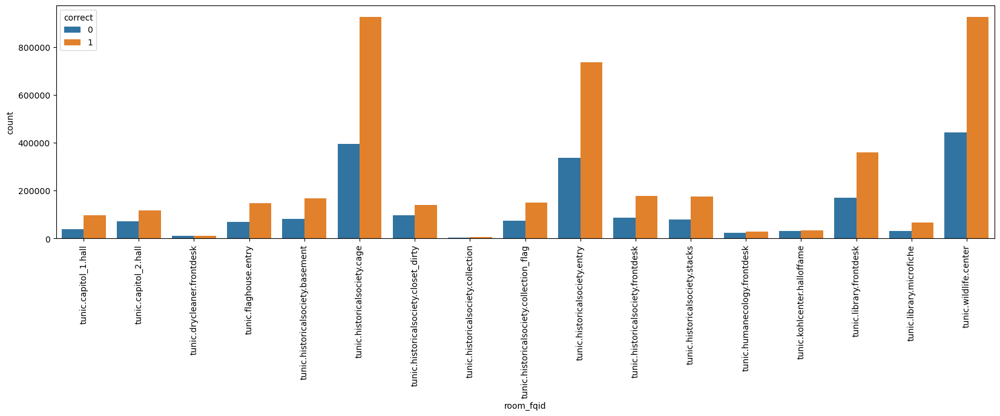

In [60]:
cat_fields_list = ["fqid", "room_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(20, 5))
    sns.countplot(data=df__navigate_click, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

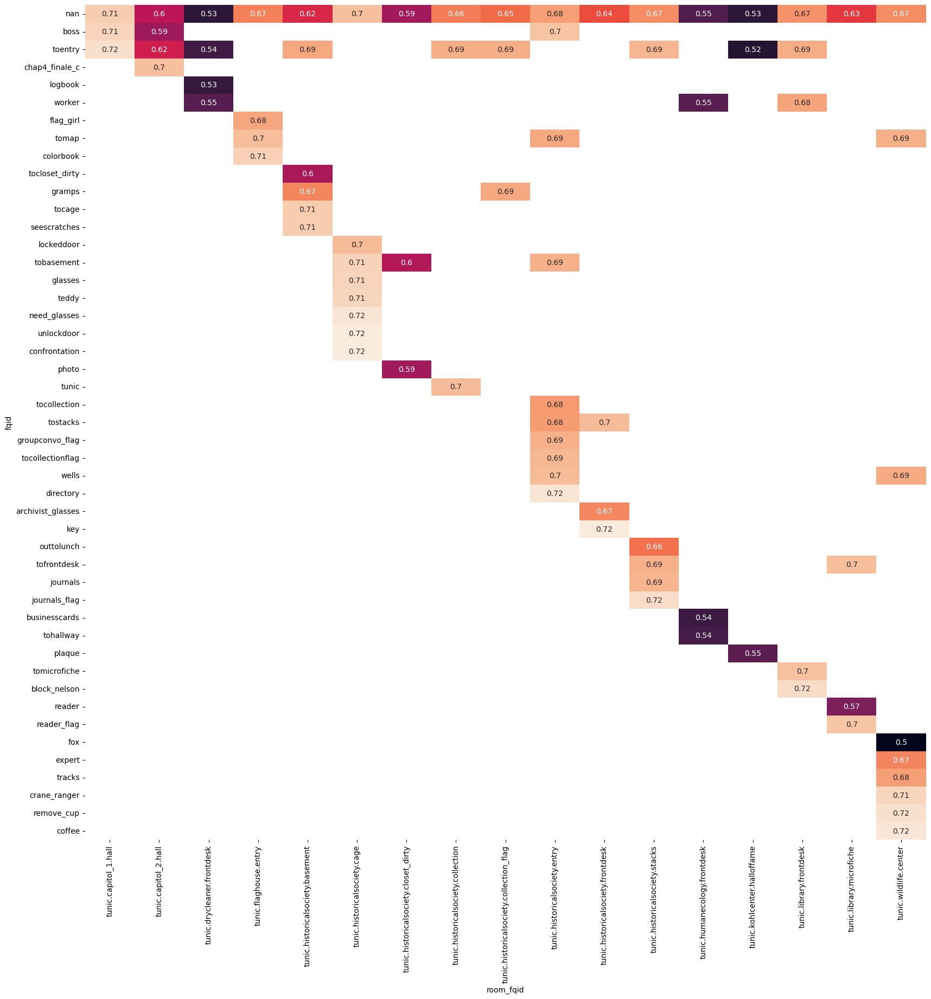

In [61]:
col_pair = ["fqid", "room_fqid"]
plot_heatmap(get_heatmap_values(df__navigate_click, col_pair), figsize=(20, 20))

## `event_name` == `"notebook_click"`

In [62]:
df__notebook_click = df[df["event_name"] == "notebook_click"].reset_index(drop=True)
df__notebook_click.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312433251036,638,1239444,notebook_click,open,15.0,4.0,-1537.00,-356.5000,31.0,629.0,NaN,undefined,NaN,tunic.historicalsociety.cage,NaN,0,0,0,0
1,20090312433251036,639,1244575,notebook_click,basic,15.0,4.0,-1378.00,-126.9375,232.0,427.0,NaN,undefined,NaN,tunic.historicalsociety.cage,NaN,0,0,0,0
2,20090312433251036,640,1246154,notebook_click,close,15.0,4.0,-689.50,257.7500,839.0,88.0,NaN,undefined,NaN,tunic.historicalsociety.cage,NaN,0,0,0,0
3,20090312433251036,736,1417626,notebook_click,open,17.0,4.0,-180.75,-469.5000,48.0,618.0,NaN,undefined,NaN,tunic.historicalsociety.entry,NaN,0,0,0,0
4,20090312433251036,737,1445314,notebook_click,close,17.0,4.0,1063.00,417.7500,812.0,73.0,NaN,undefined,NaN,tunic.historicalsociety.entry,NaN,0,0,0,0


#### Update Category Fields

In [63]:
df__notebook_click = recategorize_category_typed_fields(df__notebook_click)

In [64]:
summary = summarize_data_info(df__notebook_click)
summary

Data Shape: (300668, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,18712,20090312433251036,20090312433251036,20090312433251036,20090312433251036.0,22100221145014656.0
index,int16,0.0,3388,638,639,640,0.0,20384.0
elapsed_time,int32,0.0,285877,1239444,1244575,1246154,325220.0,1988605536.0
event_name,category,0.0,1,notebook_click,notebook_click,notebook_click,NaN,NaN
name,category,0.0,5,open,basic,close,NaN,NaN
level,float16,0.0,10,15.0,15.0,15.0,13.0,22.0
page,float16,0.0,7,4.0,4.0,4.0,0.0,6.0
room_coor_x,float16,0.0,13373,-1537.0,-1378.0,-689.5,-1991.0,1258.0
room_coor_y,float16,0.0,10571,-356.5,-126.9375,257.75,-915.5,535.0
screen_coor_x,float16,0.0,2794,31.0,232.0,839.0,0.0,1904.0


In [65]:
df__notebook_click["name"].value_counts(dropna=False)

open     124759
close    124757
basic     30553
prev      12916
next       7683
Name: name, dtype: int64

In [66]:
df__notebook_click["page"].value_counts(dropna=False)

5.0    101171
6.0     90743
4.0     88197
3.0     11184
0.0      3372
2.0      3195
1.0      2806
Name: page, dtype: int64

#### Insights

- `name` field has 5 different values (open, close, basic, prev, next).
- `page` field has 7 different values (0, 1, 2, 3, 4, 5, 6).
- `text` field is constant (undefined).
- `fqid` field is constant (nan).
- `text_fqid` field is constant (nan).
- **NULL FIELDS**:
    - `hover_duration`

#### Categorical Fields

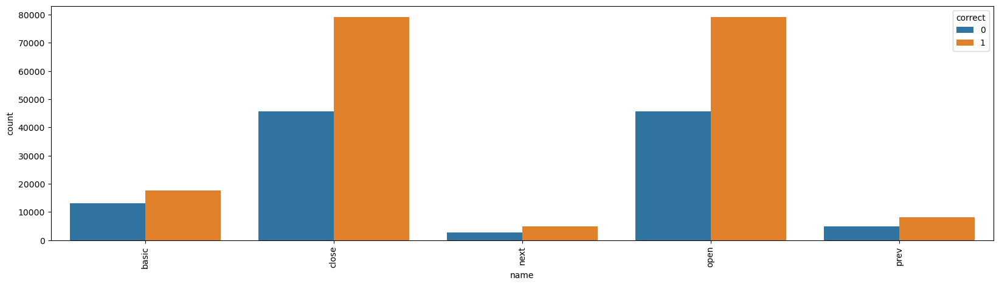

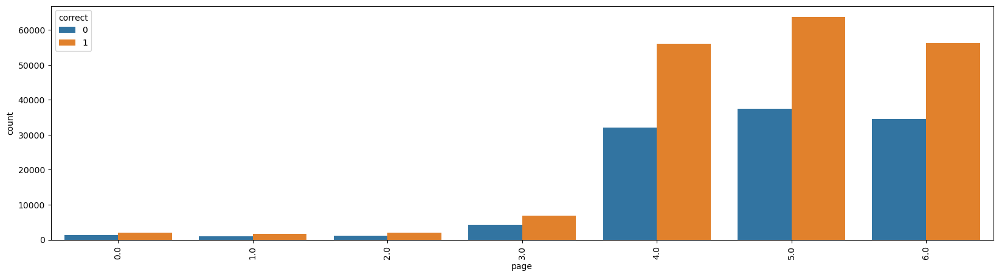

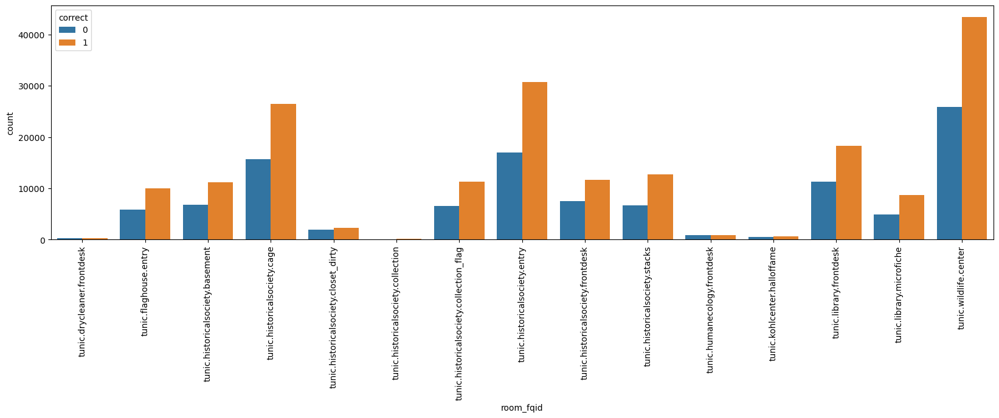

In [67]:
cat_fields_list = ["name", "page", "room_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(20, 5))
    sns.countplot(data=df__notebook_click, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

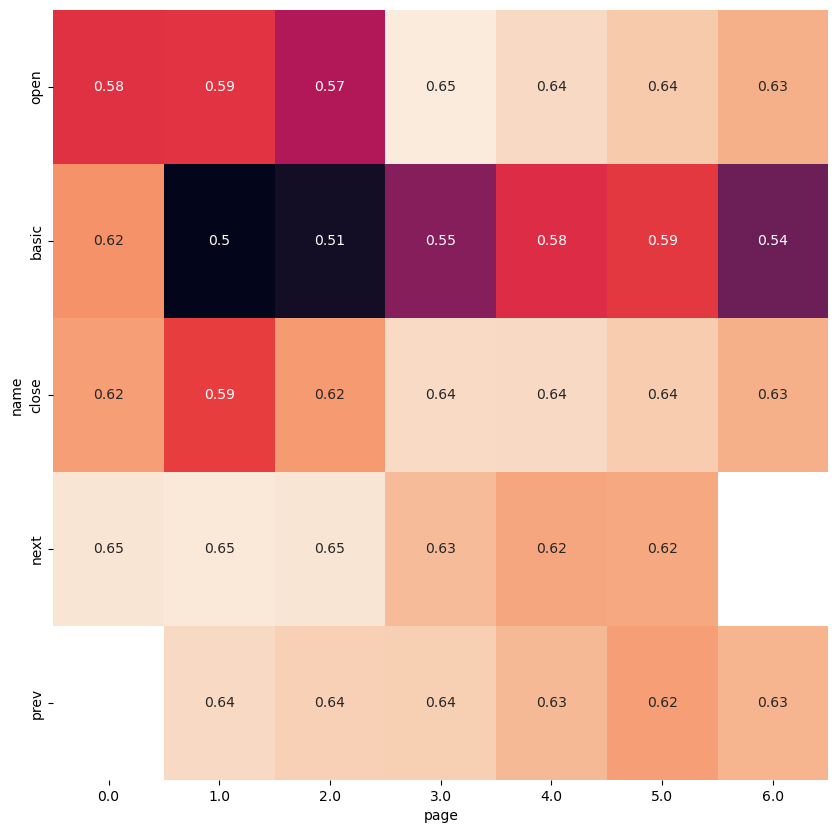

In [68]:
col_pair = ["name", "page"]
plot_heatmap(get_heatmap_values(df__notebook_click, col_pair), figsize=(10, 10))

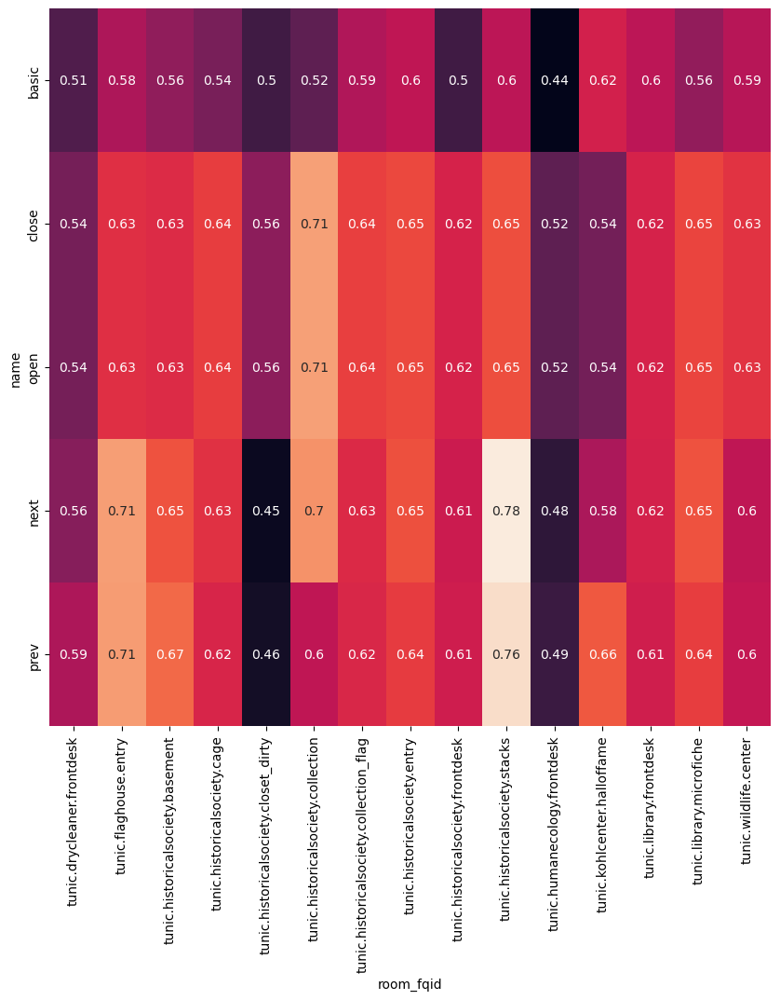

In [69]:
col_pair = ["name", "room_fqid"]
plot_heatmap(get_heatmap_values(df__notebook_click, col_pair), figsize=(10, 10))

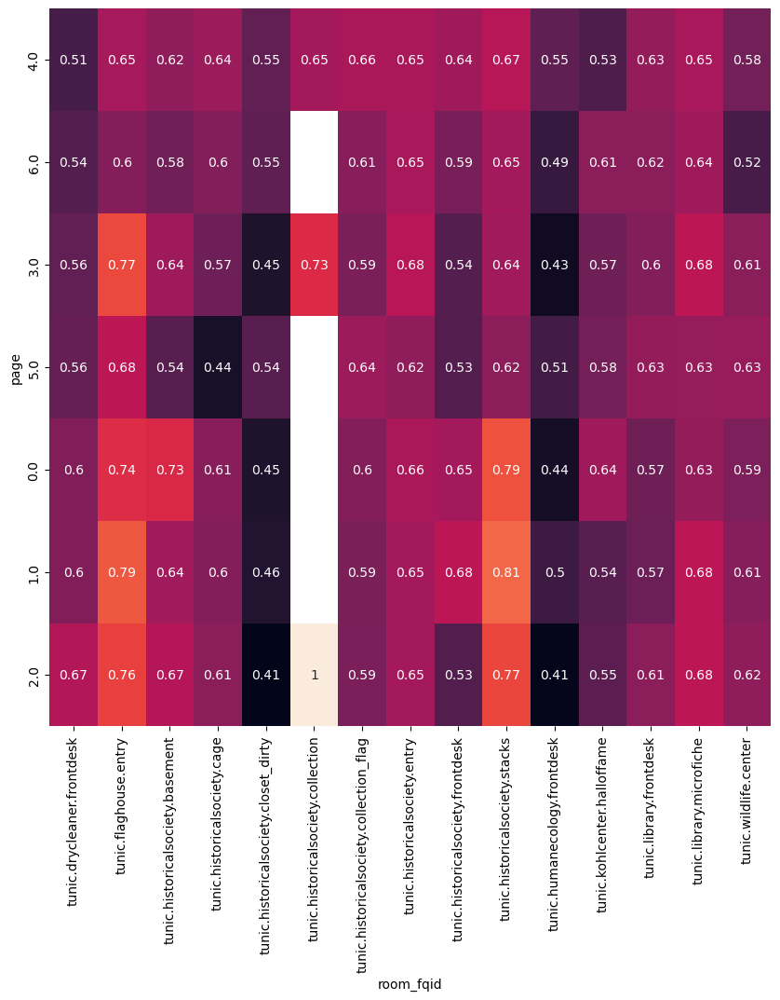

In [70]:
col_pair = ["page", "room_fqid"]
plot_heatmap(get_heatmap_values(df__notebook_click, col_pair), figsize=(10, 10))

## `event_name` == `"notification_click"`

In [71]:
df__notification_click = df[df["event_name"] == "notification_click"].reset_index(drop=True)
df__notification_click.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,598,909809,notification_click,basic,15.0,NaN,-269.25,-360.50,398.0,551.0,NaN,Those are the same glasses!,NaN,tunic.historicalsociety.entry,tunic.historicalsociety.entry.directory.closeu...,0,0,1,1
1,20090312431273200,599,910274,notification_click,basic,15.0,NaN,-269.25,-360.50,398.0,551.0,NaN,The archivist must've taken Teddy!,NaN,tunic.historicalsociety.entry,tunic.historicalsociety.entry.directory.closeu...,0,0,1,1
2,20090312431273200,601,912192,notification_click,basic,15.0,NaN,478.00,426.00,857.0,68.0,NaN,Those are the same glasses!,NaN,tunic.historicalsociety.entry,tunic.historicalsociety.entry.directory.closeu...,0,0,1,1
3,20090312431273200,602,912976,notification_click,basic,15.0,NaN,481.25,460.25,859.0,47.0,NaN,The archivist must've taken Teddy!,NaN,tunic.historicalsociety.entry,tunic.historicalsociety.entry.directory.closeu...,0,0,1,1
4,20090312431273200,787,1104231,notification_click,basic,18.0,NaN,1011.50,-410.75,698.0,352.0,NaN,That hoofprint doesn't match the flag!,NaN,tunic.wildlife.center,tunic.wildlife.center.tracks.hub.deer,0,0,1,1


#### Update Category Fields

In [72]:
df__notification_click = recategorize_category_typed_fields(df__notification_click)

In [73]:
summary = summarize_data_info(df__notification_click)
summary

Data Shape: (242957, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.0,3319,598,599,601,0.0,20458.0
elapsed_time,int32,0.0,232948,909809,910274,912192,182.0,1988525224.0
event_name,category,0.0,1,notification_click,notification_click,notification_click,NaN,NaN
name,category,0.0,1,basic,basic,basic,NaN,NaN
level,float16,0.0,10,15.0,15.0,15.0,13.0,22.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,0.0,10014,-269.25,-269.25,478.0,-914.0,1262.0
room_coor_y,float16,0.0,9569,-360.5,-360.5,426.0,-812.0,536.5
screen_coor_x,float16,0.0,2248,398.0,398.0,857.0,0.0,1906.0


#### Insights

- `name` field is constant (basic).
- `fqid` field is constant (nan).
- **NULL FIELDS**:
    - `page`
    - `hover_duration`

#### Categorical Fields

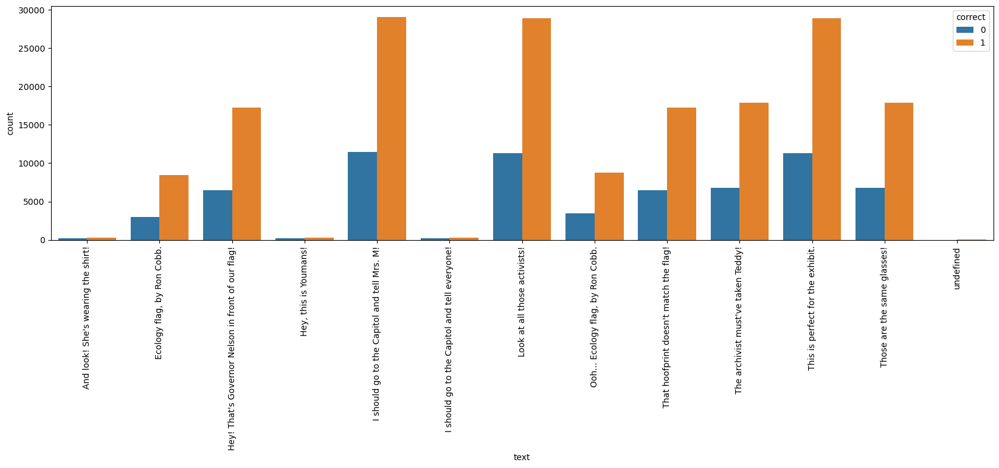

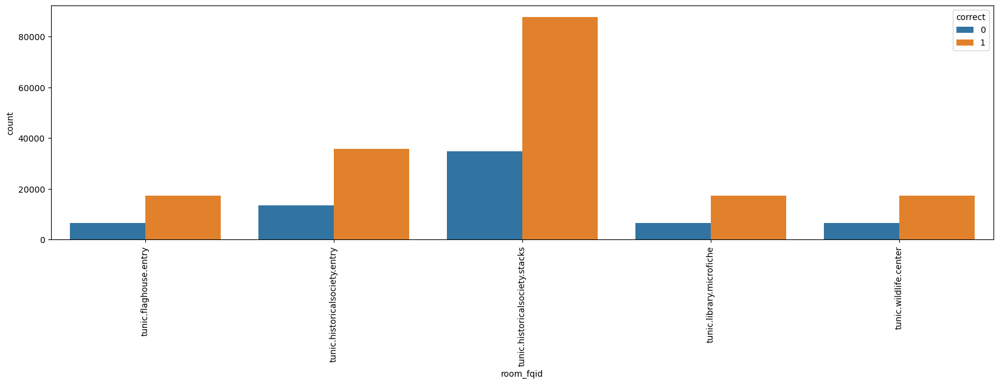

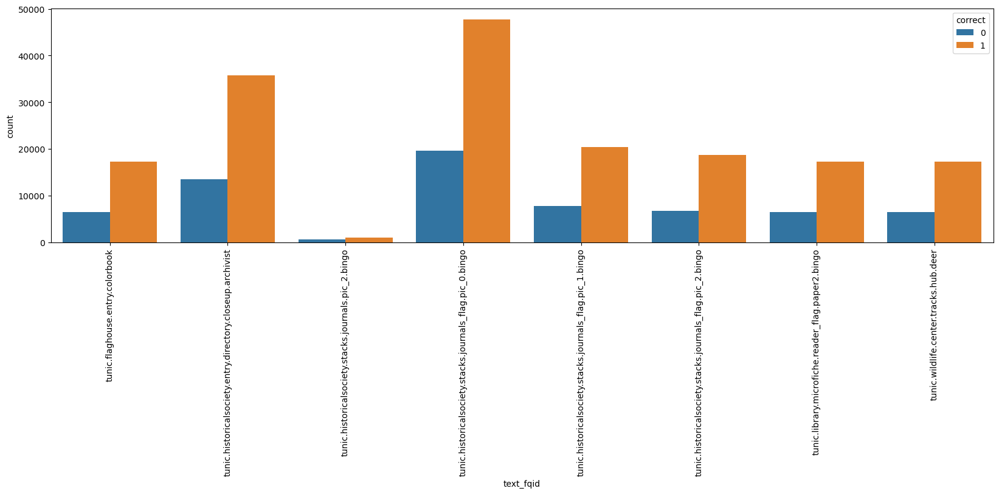

In [74]:
cat_fields_list = ["text", "room_fqid", "text_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(20, 5))
    sns.countplot(data=df__notification_click, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

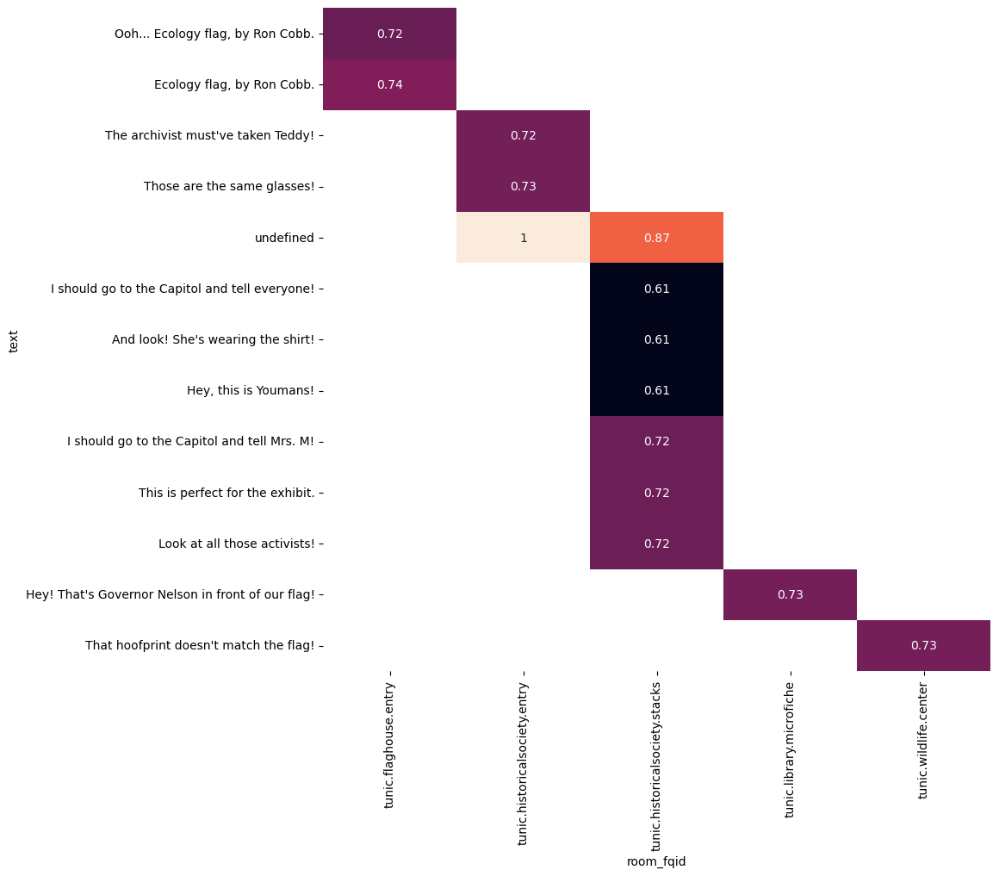

In [75]:
col_pair = ["text", "room_fqid"]
plot_heatmap(get_heatmap_values(df__notification_click, col_pair), figsize=(10, 10))

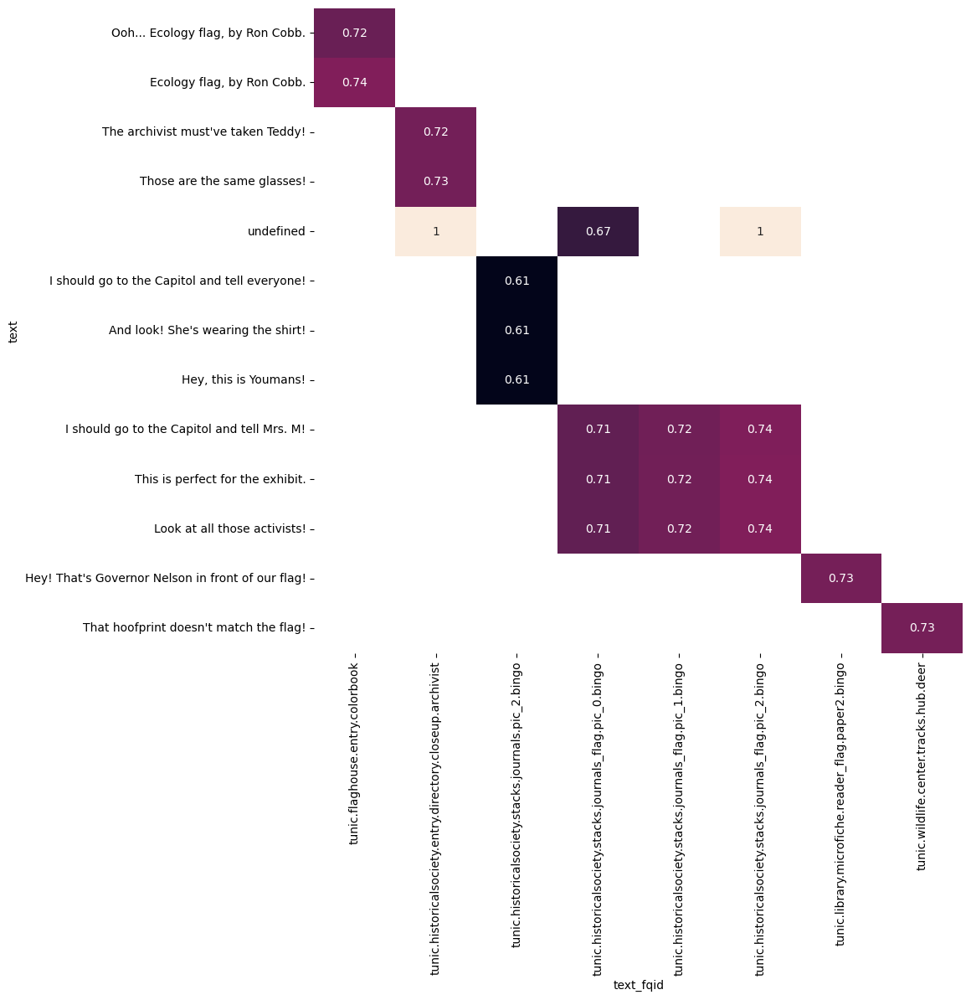

In [76]:
col_pair = ["text", "text_fqid"]
plot_heatmap(get_heatmap_values(df__notification_click, col_pair), figsize=(10, 10))

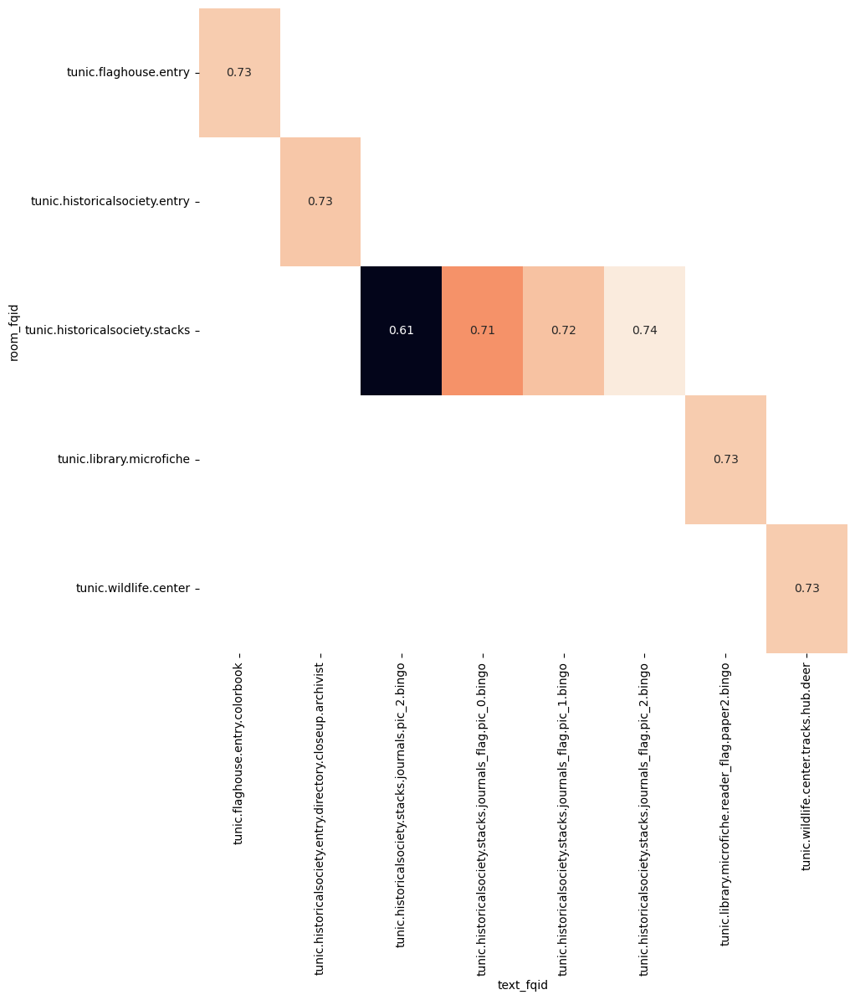

In [77]:
col_pair = ["room_fqid", "text_fqid"]
plot_heatmap(get_heatmap_values(df__notification_click, col_pair), figsize=(10, 10))

## `event_name` == `"object_click"`

In [78]:
df__object_click = df[df["event_name"] == "object_click"].reset_index(drop=True)
df__object_click.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,597,909078,object_click,basic,15.0,NaN,-269.250,-360.50,398.0,551.0,NaN,undefined,directory.closeup.archivist,tunic.historicalsociety.entry,NaN,0,0,1,1
1,20090312431273200,600,910909,object_click,basic,15.0,NaN,-171.625,-326.25,458.0,530.0,NaN,undefined,directory.closeup.archivist,tunic.historicalsociety.entry,NaN,0,0,1,1
2,20090312431273200,604,914363,object_click,close,15.0,NaN,414.500,473.25,818.0,39.0,NaN,undefined,directory,tunic.historicalsociety.entry,NaN,0,0,1,1
3,20090312431273200,786,1103032,object_click,basic,18.0,NaN,1019.500,-408.00,704.0,350.0,NaN,undefined,tracks.hub.deer,tunic.wildlife.center,NaN,0,0,1,1
4,20090312431273200,789,1104813,object_click,basic,18.0,NaN,1010.000,-410.75,697.0,352.0,NaN,undefined,tracks,tunic.wildlife.center,NaN,0,0,1,1


#### Update Category Fields

In [79]:
df__object_click = recategorize_category_typed_fields(df__object_click)

In [80]:
summary = summarize_data_info(df__object_click)
summary

Data Shape: (712491, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.0,4162,597,600,604,0.0,20462.0
elapsed_time,int32,0.0,634652,909078,910909,914363,0.0,1988526677.0
event_name,category,0.0,1,object_click,object_click,object_click,NaN,NaN
name,category,0.0,2,basic,basic,close,NaN,NaN
level,float16,0.0,10,15.0,15.0,15.0,13.0,22.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,0.0,13714,-269.25,-171.625,414.5,-954.0,1249.0
room_coor_y,float16,0.0,14879,-360.5,-326.25,473.25,-811.0,536.5
screen_coor_x,float16,0.0,3555,398.0,458.0,818.0,0.0,1919.0


#### Insights

- `name` field has two values (basic, close).
- `text` field is constant (undefined).
- `text_fqid` field is constant (nan).
- **NULL FIELDS**:
    - `page`
    - `hover_duration`

#### Categorical Fields

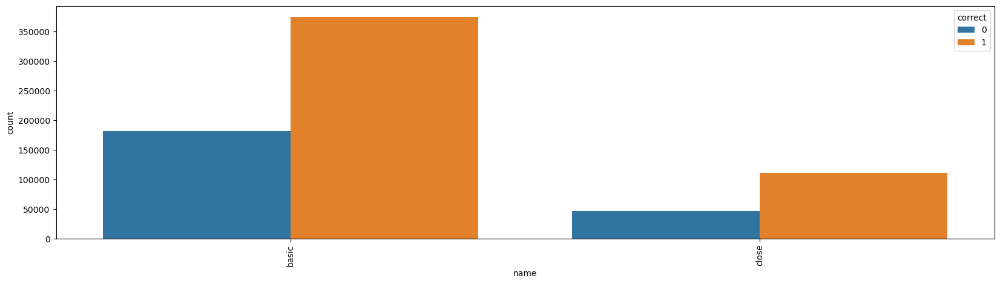

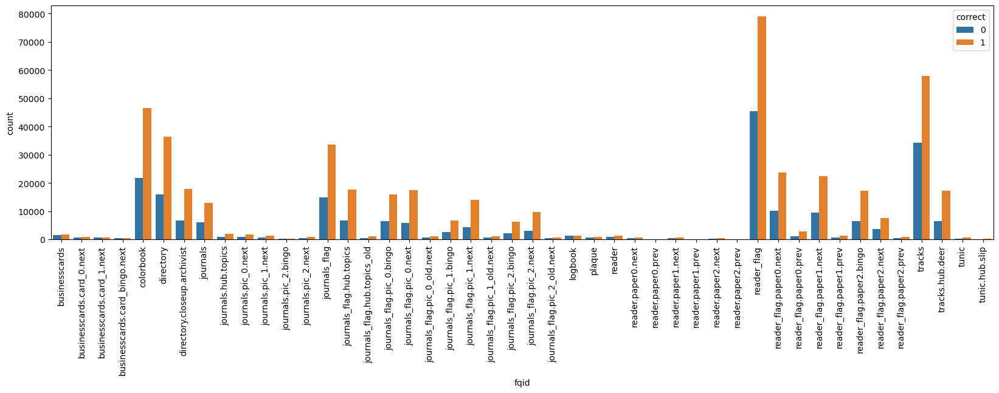

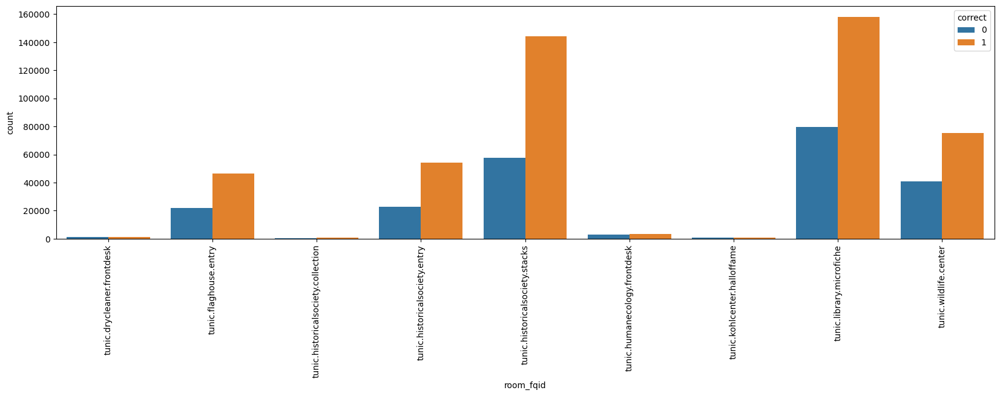

In [81]:
cat_fields_list = ["name", "fqid", "room_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(20, 5))
    sns.countplot(data=df__object_click, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

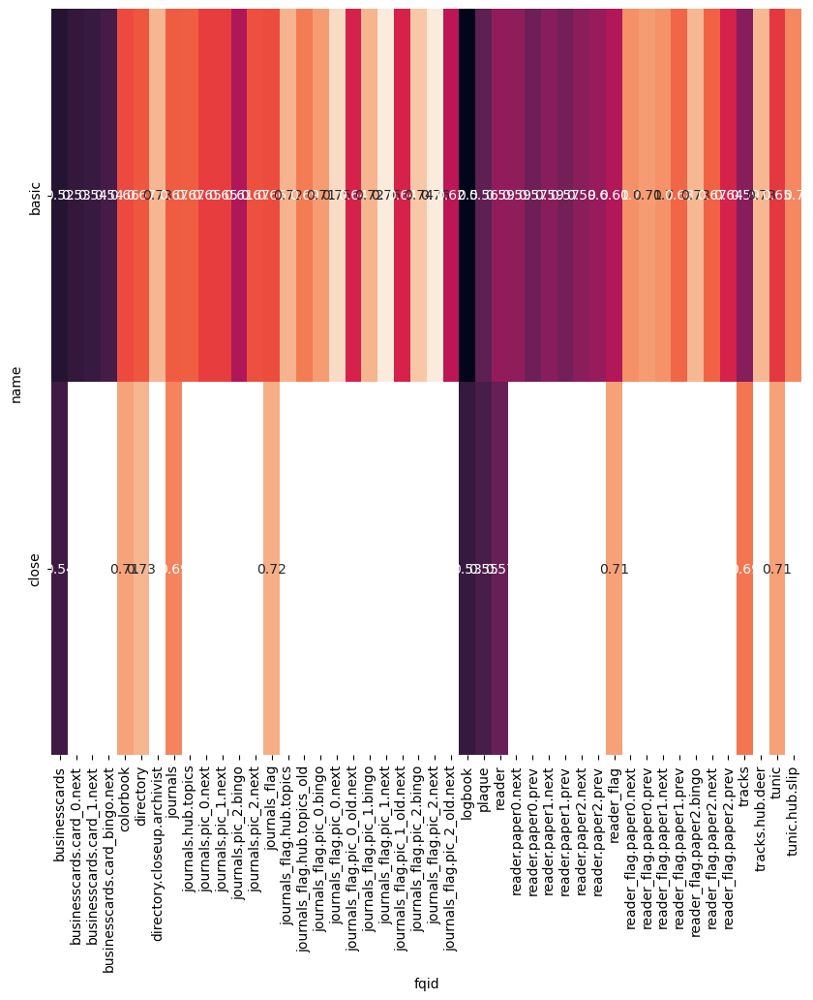

In [82]:
col_pair = ["name", "fqid"]
plot_heatmap(get_heatmap_values(df__object_click, col_pair), figsize=(10, 10))

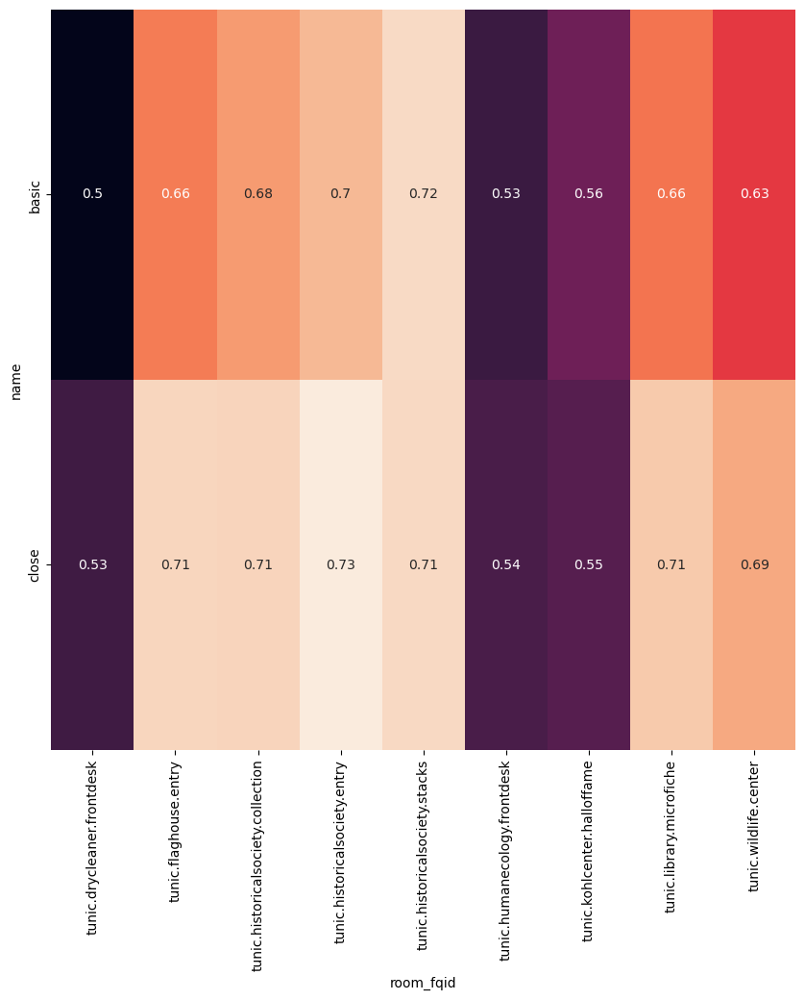

In [83]:
col_pair = ["name", "room_fqid"]
plot_heatmap(get_heatmap_values(df__object_click, col_pair), figsize=(10, 10))

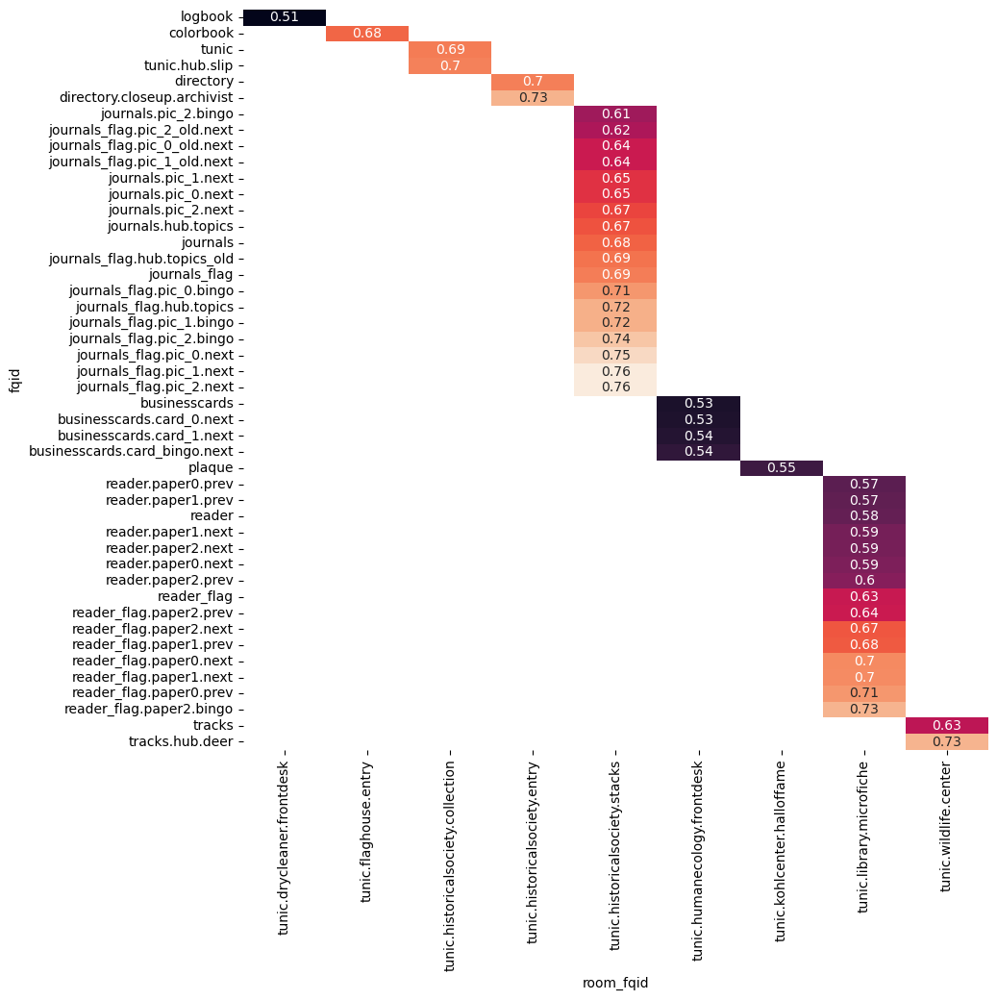

In [84]:
col_pair = ["fqid", "room_fqid"]
plot_heatmap(get_heatmap_values(df__object_click, col_pair), figsize=(10, 10))

## `event_name` == `"object_hover"`

In [85]:
df__object_hover = df[df["event_name"] == "object_hover"].reset_index(drop=True)
df__object_hover.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,595,904875,object_hover,basic,15.0,NaN,NaN,NaN,NaN,NaN,917.0,undefined,directory,tunic.historicalsociety.entry,NaN,0,0,1,1
1,20090312431273200,596,907873,object_hover,undefined,15.0,NaN,NaN,NaN,NaN,NaN,716.0,undefined,directory.closeup.archivist,tunic.historicalsociety.entry,NaN,0,0,1,1
2,20090312431273200,603,913192,object_hover,undefined,15.0,NaN,NaN,NaN,NaN,NaN,4750.0,undefined,directory.closeup.archivist,tunic.historicalsociety.entry,NaN,0,0,1,1
3,20090312431273200,784,1099731,object_hover,basic,18.0,NaN,NaN,NaN,NaN,NaN,784.0,undefined,tracks,tunic.wildlife.center,NaN,0,0,1,1
4,20090312431273200,785,1099799,object_hover,undefined,18.0,NaN,NaN,NaN,NaN,NaN,17.0,undefined,tracks.hub.deer,tunic.wildlife.center,NaN,0,0,1,1


#### Update Category Fields

In [86]:
df__object_hover = recategorize_category_typed_fields(df__object_hover)

In [87]:
summary = summarize_data_info(df__object_hover)
summary

Data Shape: (425694, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,21689,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.0,3483,595,596,603,0.0,20461.0
elapsed_time,int32,0.0,396526,904875,907873,913192,104.0,1988525877.0
event_name,category,0.0,1,object_hover,object_hover,object_hover,NaN,NaN
name,category,0.0,2,basic,undefined,undefined,NaN,NaN
level,float16,0.0,10,15.0,15.0,15.0,13.0,22.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_y,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
screen_coor_x,float16,1.0,0,NaN,NaN,NaN,NaN,NaN


#### Insights

- `name` field has two values (basic, undefined).
- `text` field is constant (undefined).
- `text_fqid` field is constant (nan).
- **NULL FIELDS**:
    - `page`
    - `room_coor_x`
    - `room_coor_y`
    - `screen_coor_x`
    - `screen_coor_y`

#### Categorical Fields

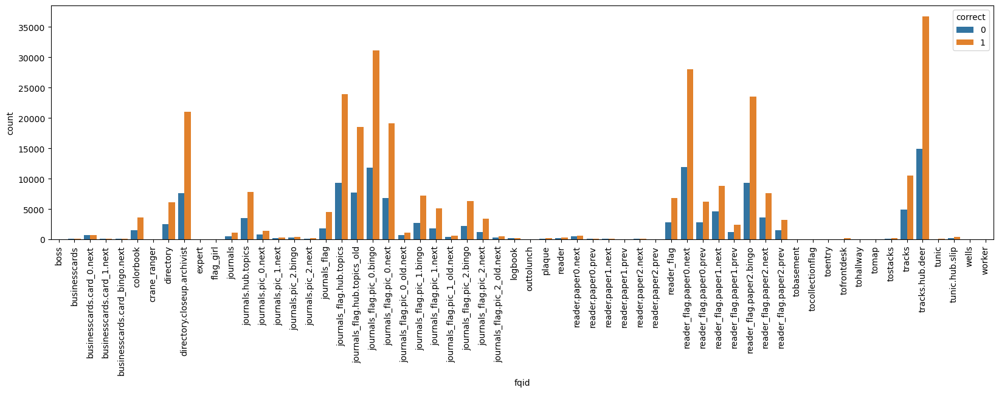

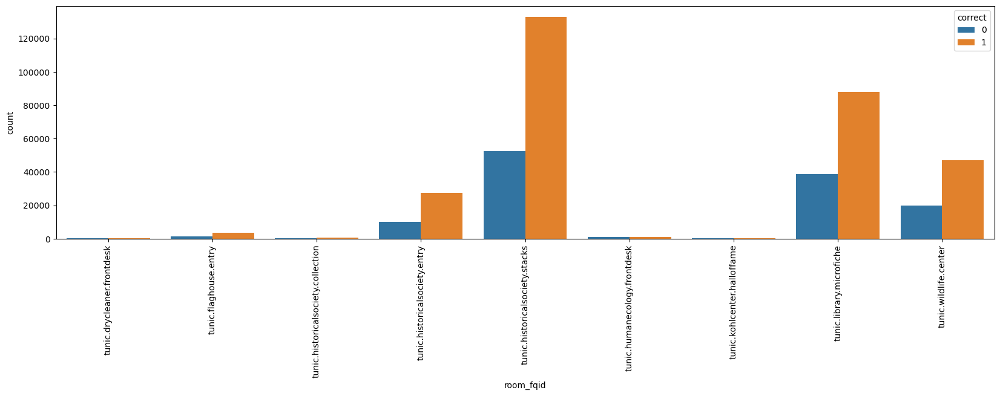

In [88]:
cat_fields_list = ["fqid", "room_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(20, 5))
    sns.countplot(data=df__object_hover, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

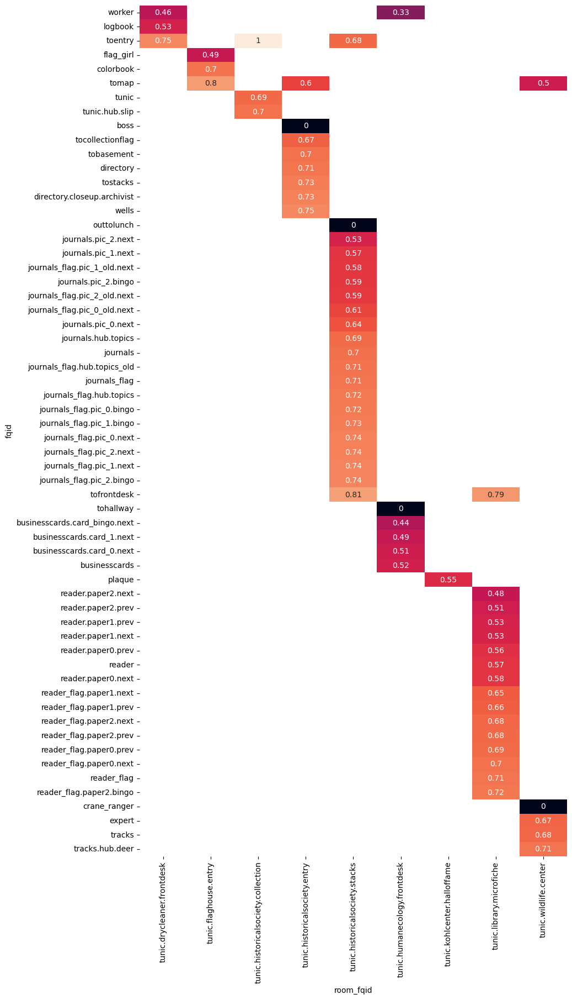

In [89]:
col_pair = ["fqid", "room_fqid"]
plot_heatmap(get_heatmap_values(df__object_hover, col_pair), figsize=(10, 20))

## `event_name` == `"observation_click"`

In [90]:
df__observation_click = df[df["event_name"] == "observation_click"].reset_index(drop=True)
df__observation_click.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,608,920474,observation_click,basic,15.0,NaN,-49.437500,-23.0000,374.0,353.0,NaN,Yes! It's the key for Teddy's cage!,key,tunic.historicalsociety.frontdesk,tunic.historicalsociety.frontdesk.key,0,0,1,1
1,20090312431273200,725,1050634,observation_click,basic,18.0,NaN,-583.500000,-775.5000,215.0,577.0,NaN,People sure drink a lot of coffee around here.,coffee,tunic.wildlife.center,tunic.wildlife.center.coffee,0,0,1,1
2,20090312431273200,773,1091181,observation_click,basic,18.0,NaN,439.000000,-423.5000,547.0,349.0,NaN,"It's OK, girl! Look, I found you a cricket!",remove_cup,tunic.wildlife.center,tunic.wildlife.center.remove_cup,0,0,1,1
3,20090312433251036,620,1217273,observation_click,basic,14.0,NaN,86.000000,-107.8125,735.0,416.0,NaN,It's locked!,lockeddoor,tunic.historicalsociety.cage,tunic.historicalsociety.cage.lockeddoor,0,0,0,0
4,20090312433251036,667,1275220,observation_click,basic,15.0,NaN,-0.777344,-182.0000,423.0,512.0,NaN,Yes! It's the key for Teddy's cage!,key,tunic.historicalsociety.frontdesk,tunic.historicalsociety.frontdesk.key,0,0,0,0


#### Update Category Fields

In [91]:
df__observation_click = recategorize_category_typed_fields(df__observation_click)

In [92]:
summary = summarize_data_info(df__observation_click)
summary

Data Shape: (106517, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.0,2200,608,725,773,5.0,19657.0
elapsed_time,int32,0.0,104002,920474,1050634,1091181,232.0,1988385266.0
event_name,category,0.0,1,observation_click,observation_click,observation_click,NaN,NaN
name,category,0.0,1,basic,basic,basic,NaN,NaN
level,float16,0.0,10,15.0,18.0,18.0,13.0,22.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,0.0,15957,-49.4375,-583.5,439.0,-1972.0,908.0
room_coor_y,float16,0.0,9060,-23.0,-775.5,-423.5,-885.0,295.75
screen_coor_x,float16,0.0,1656,374.0,215.0,547.0,0.0,1487.0


#### Insights

- `name` field is constant (basic).
- **NULL FIELDS**:
    - `page`
    - `hover_duration`

#### Categorical Fields

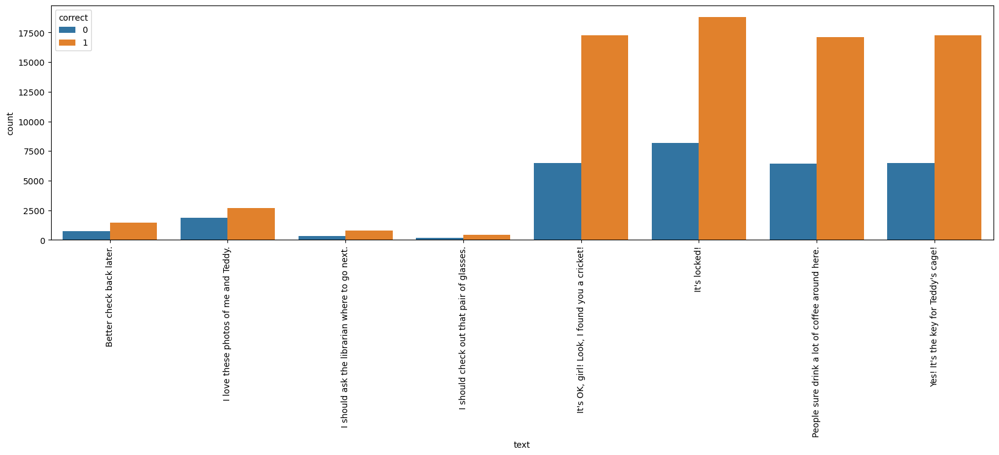

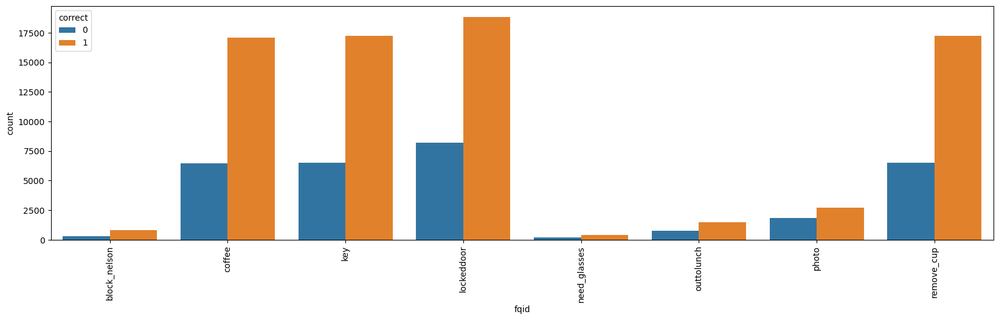

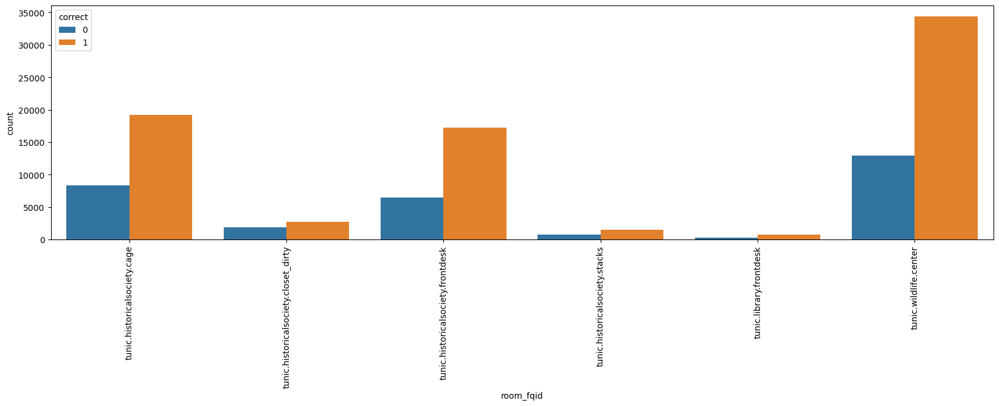

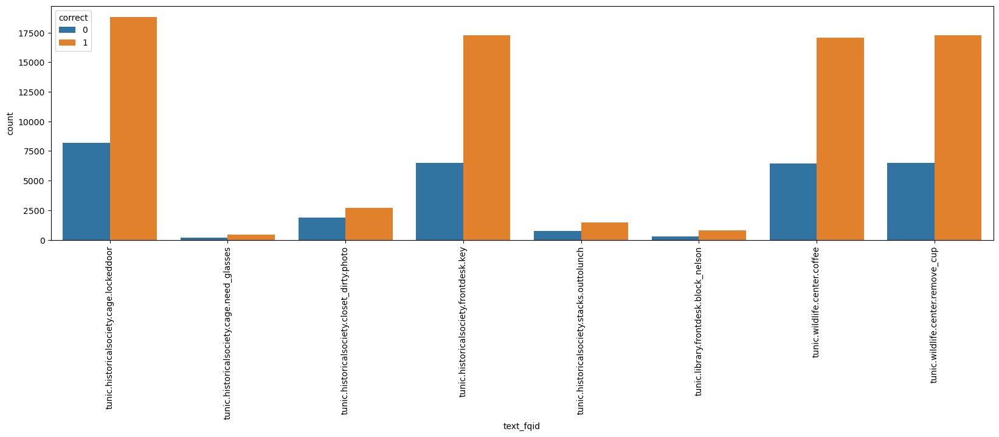

In [93]:
cat_fields_list = ["text", "fqid", "room_fqid", "text_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(20, 5))
    sns.countplot(data=df__observation_click, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

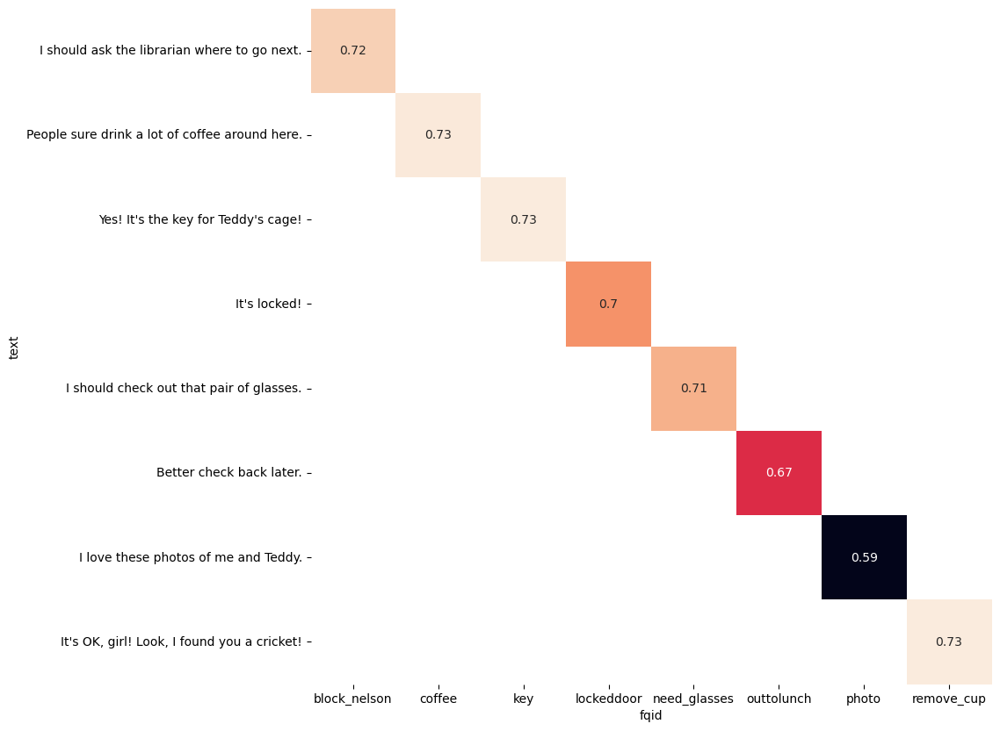

In [94]:
col_pair = ["text", "fqid"]
plot_heatmap(get_heatmap_values(df__observation_click, col_pair), figsize=(10, 10))

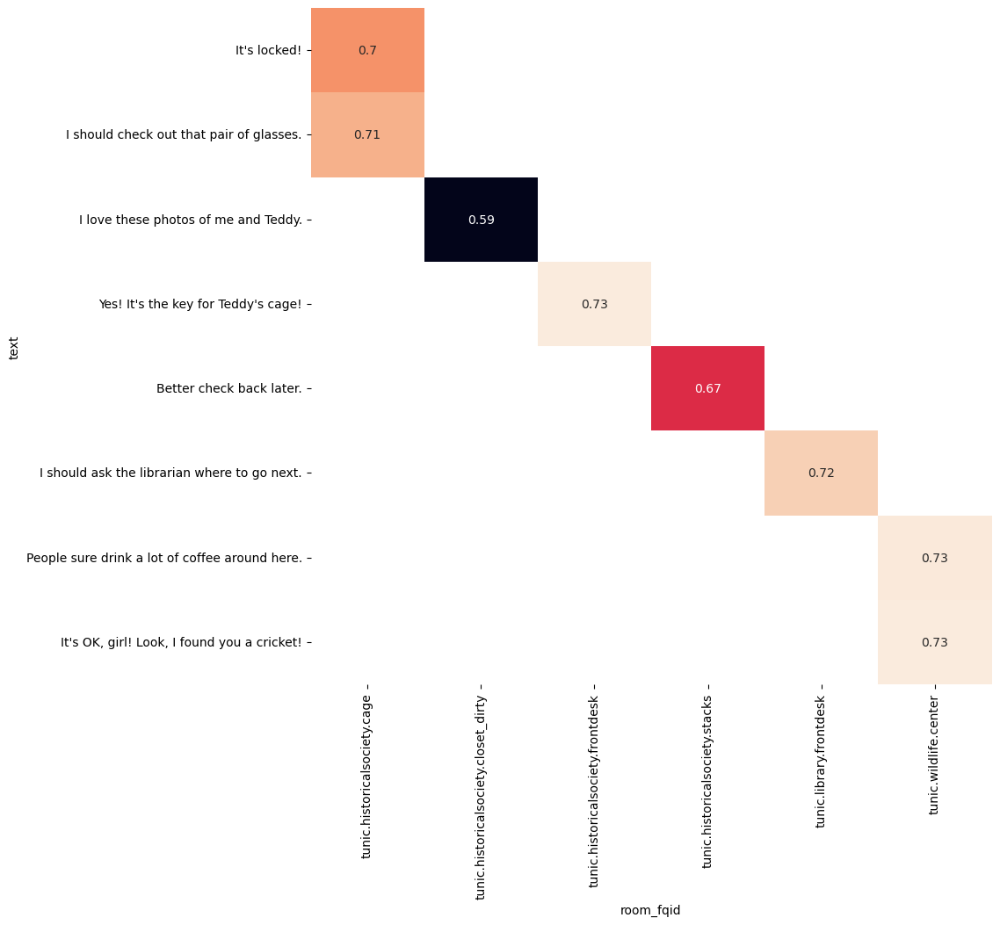

In [95]:
col_pair = ["text", "room_fqid"]
plot_heatmap(get_heatmap_values(df__observation_click, col_pair), figsize=(10, 10))

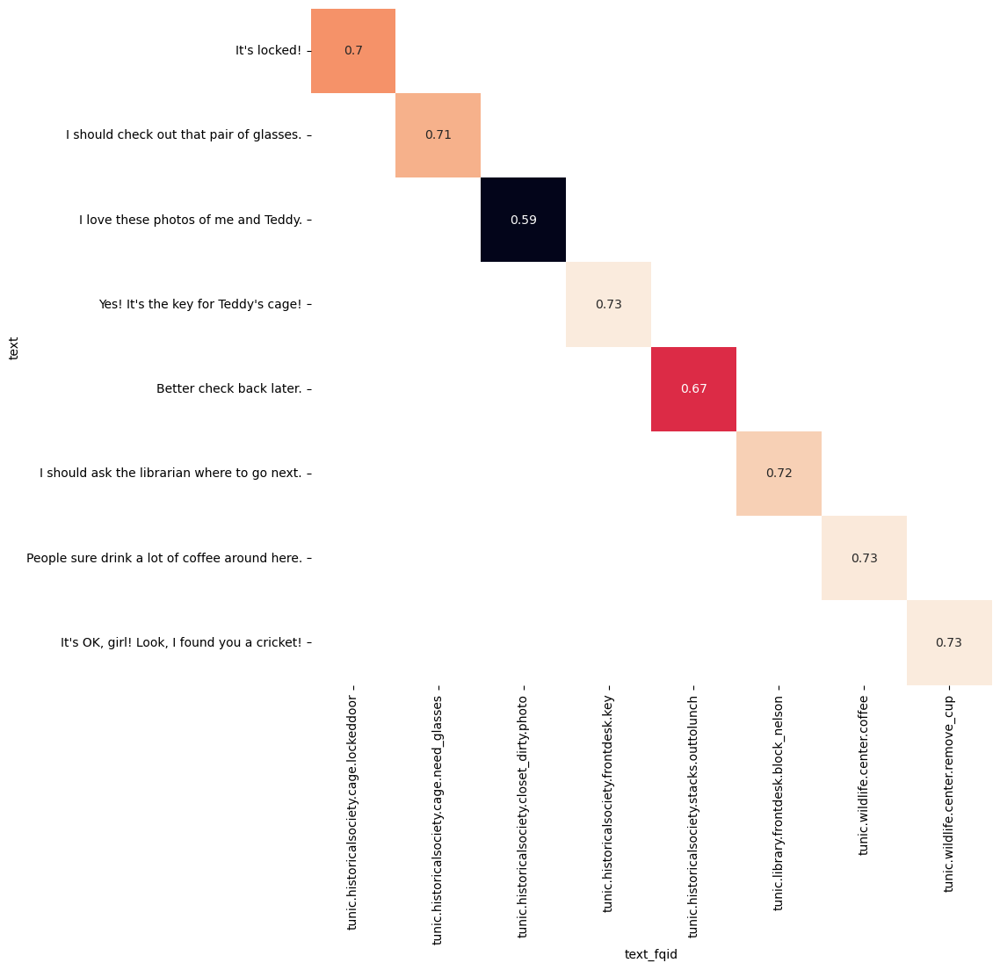

In [96]:
col_pair = ["text", "text_fqid"]
plot_heatmap(get_heatmap_values(df__observation_click, col_pair), figsize=(10, 10))

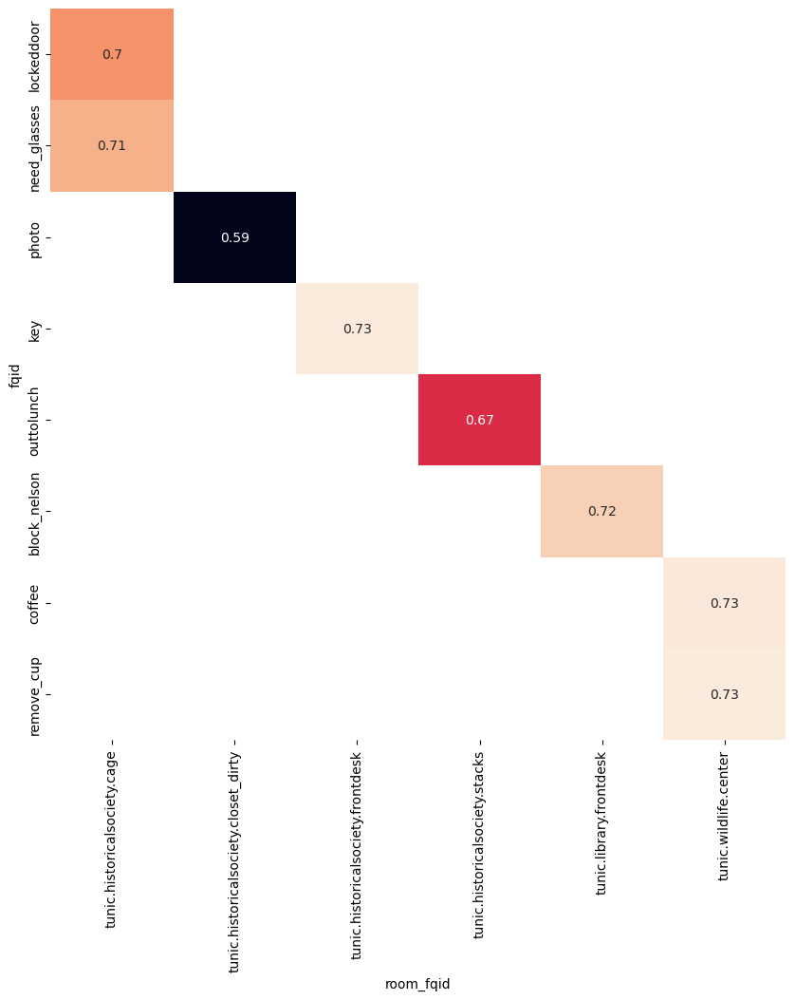

In [97]:
col_pair = ["fqid", "room_fqid"]
plot_heatmap(get_heatmap_values(df__observation_click, col_pair), figsize=(10, 10))

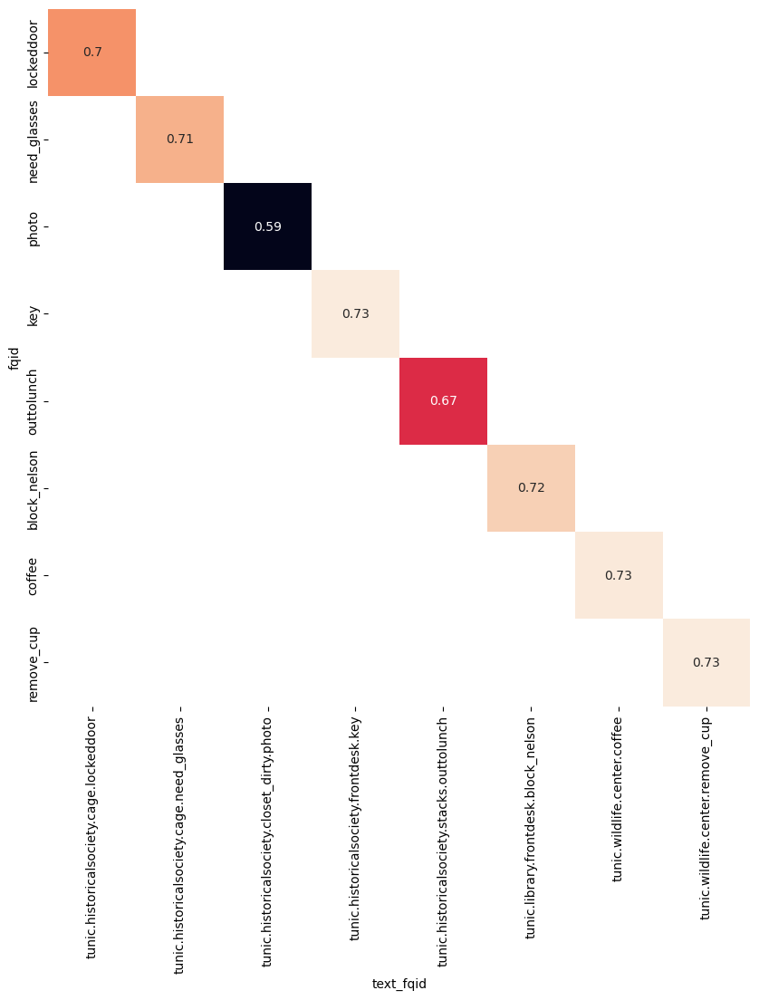

In [98]:
col_pair = ["fqid", "text_fqid"]
plot_heatmap(get_heatmap_values(df__observation_click, col_pair), figsize=(10, 10))

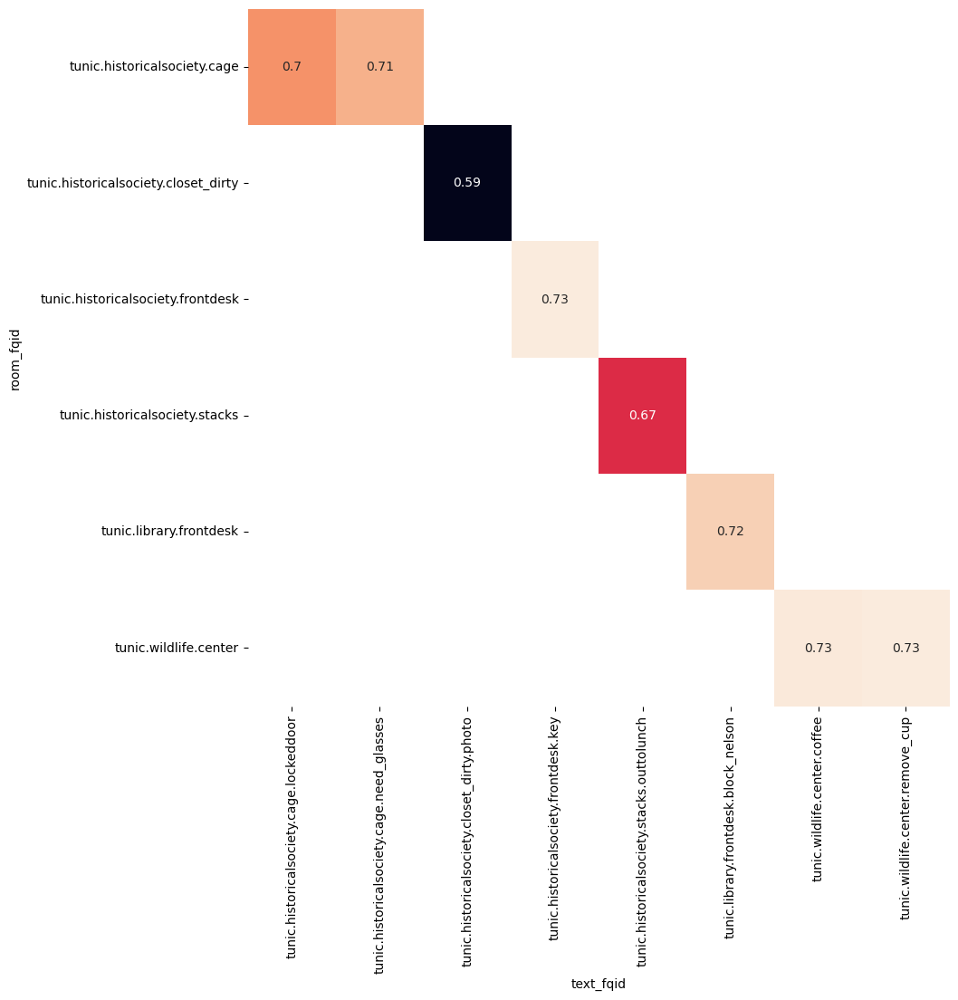

In [99]:
col_pair = ["room_fqid", "text_fqid"]
plot_heatmap(get_heatmap_values(df__observation_click, col_pair), figsize=(10, 10))

## `event_name` == `"person_click"`

In [100]:
df__person_click = df[df["event_name"] == "person_click"].reset_index(drop=True)
df__person_click.head()

,session_id,index,elapsed_time,event_name,name,level,page,room_coor_x,room_coor_y,screen_coor_x,screen_coor_y,hover_duration,text,fqid,room_fqid,text_fqid,fullscreen,hq,music,correct
0,20090312431273200,538,858662,person_click,basic,13.0,NaN,43.90625,-137.875,406.0,415.0,NaN,We'll find Teddy.,gramps,tunic.historicalsociety.basement,tunic.historicalsociety.basement.gramps.whatdo,0,0,1,1
1,20090312431273200,539,860233,person_click,basic,13.0,NaN,-188.12500,-56.375,236.0,356.0,NaN,We just have to keep our eyes open!,gramps,tunic.historicalsociety.basement,tunic.historicalsociety.basement.gramps.whatdo,0,0,1,1
2,20090312431273200,560,877826,person_click,basic,14.0,NaN,-642.00000,-235.250,621.0,522.0,NaN,I wonder whose glasses these are.,glasses,tunic.historicalsociety.cage,tunic.historicalsociety.cage.glasses.beforeteddy,0,0,1,1
3,20090312431273200,565,881960,person_click,basic,14.0,NaN,87.18750,-112.125,722.0,418.0,NaN,Teddy!!!,teddy,tunic.historicalsociety.cage,tunic.historicalsociety.cage.teddy.trapped,0,0,1,1
4,20090312431273200,566,882426,person_click,basic,14.0,NaN,103.37500,-111.625,722.0,418.0,NaN,Hang on. I'll get you out of there!,teddy,tunic.historicalsociety.cage,tunic.historicalsociety.cage.teddy.trapped,0,0,1,1


#### Update Category Fields

In [101]:
df__person_click = recategorize_category_typed_fields(df__person_click)

In [102]:
summary = summarize_data_info(df__person_click)
summary

Data Shape: (2875847, 20)


,data_type,perc_missing,n_unique,first_value,second_value,third_value,min,max
session_id,int64,0.0,23562,20090312431273200,20090312431273200,20090312431273200,20090312431273200.0,22100221145014656.0
index,int16,0.0,4351,538,539,560,0.0,20388.0
elapsed_time,int32,0.0,1829252,858662,860233,877826,100.0,1988597956.0
event_name,category,0.0,1,person_click,person_click,person_click,NaN,NaN
name,category,0.0,1,basic,basic,basic,NaN,NaN
level,float16,0.0,10,13.0,13.0,14.0,13.0,22.0
page,float16,1.0,0,NaN,NaN,NaN,NaN,NaN
room_coor_x,float16,0.0,21764,43.90625,-188.125,-642.0,-1335.0,1059.0
room_coor_y,float16,0.0,19629,-137.875,-56.375,-235.25,-839.5,527.5
screen_coor_x,float16,0.0,4051,406.0,236.0,621.0,0.0,1875.0


#### Insights

- `name` field is constant (basic).
- **NULL FIELDS**:
    - `page`
    - `hover_duration`

#### Categorical Fields

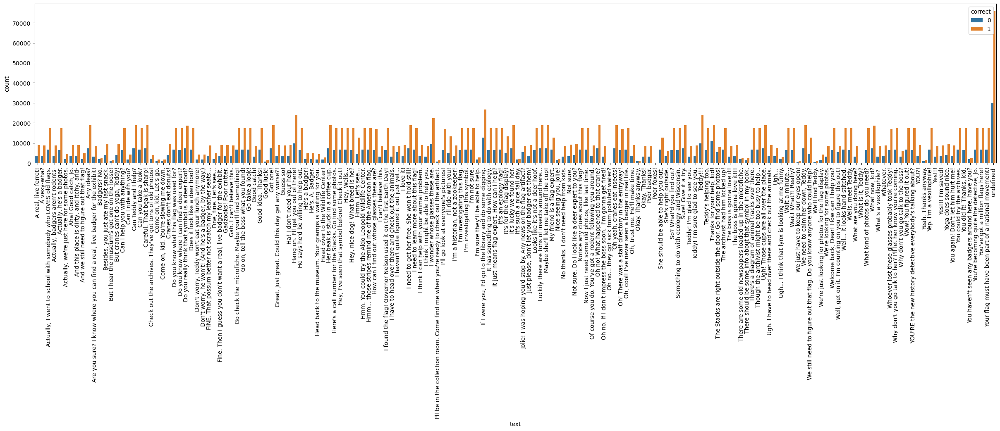

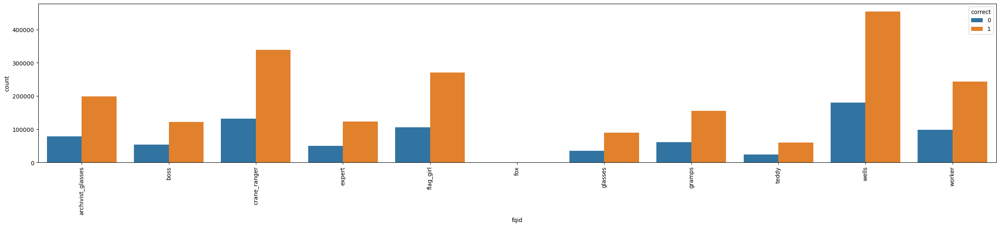

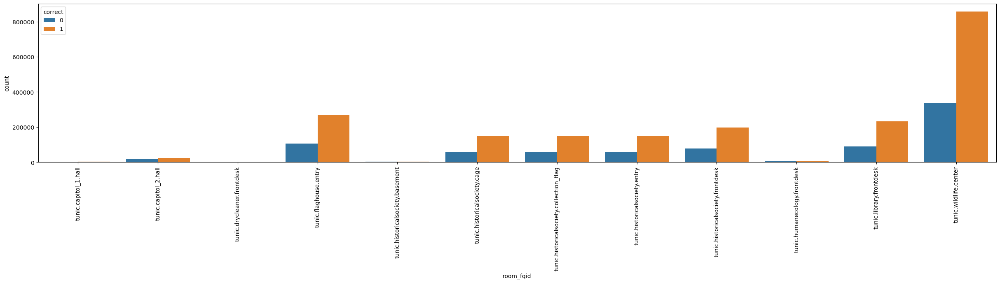

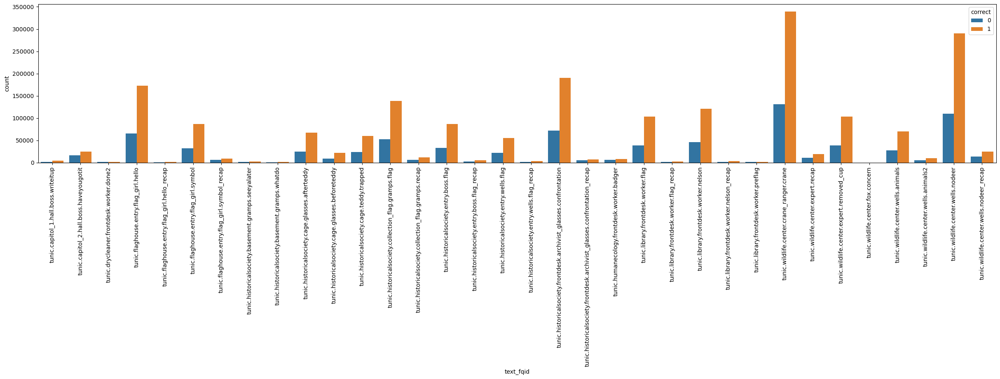

In [103]:
cat_fields_list = ["text", "fqid", "room_fqid", "text_fqid"]

for col_name in cat_fields_list:
    fig, ax = plt.subplots(figsize=(30, 5))
    sns.countplot(data=df__person_click, x=col_name, hue="correct", ax=ax)
    
    plt.xticks(rotation=90)
    plt.show()

#### Category Pairs

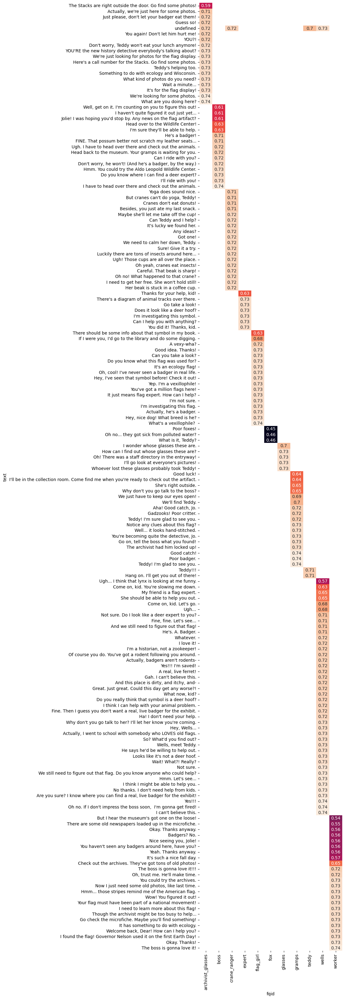

In [104]:
col_pair = ["text", "fqid"]
plot_heatmap(get_heatmap_values(df__person_click, col_pair), figsize=(6, 40))

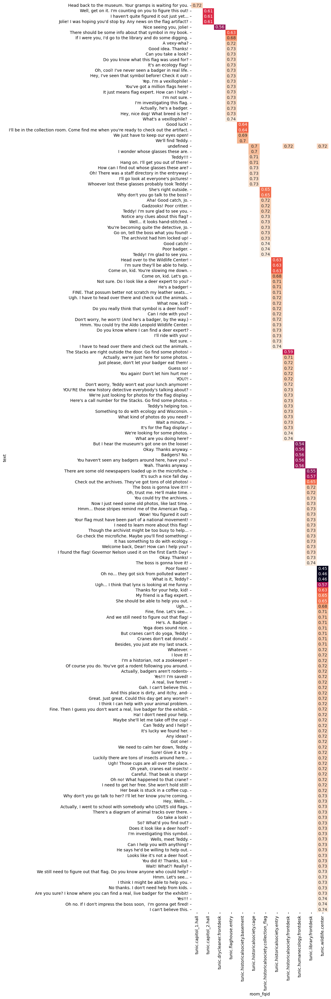

In [105]:
col_pair = ["text", "room_fqid"]
plot_heatmap(get_heatmap_values(df__person_click, col_pair), figsize=(6, 40))

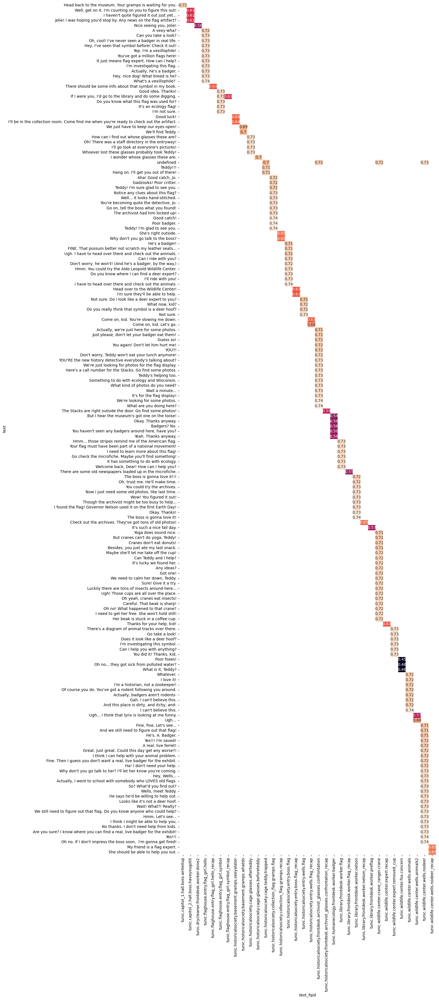

In [106]:
col_pair = ["text", "text_fqid"]
plot_heatmap(get_heatmap_values(df__person_click, col_pair), figsize=(12, 40))

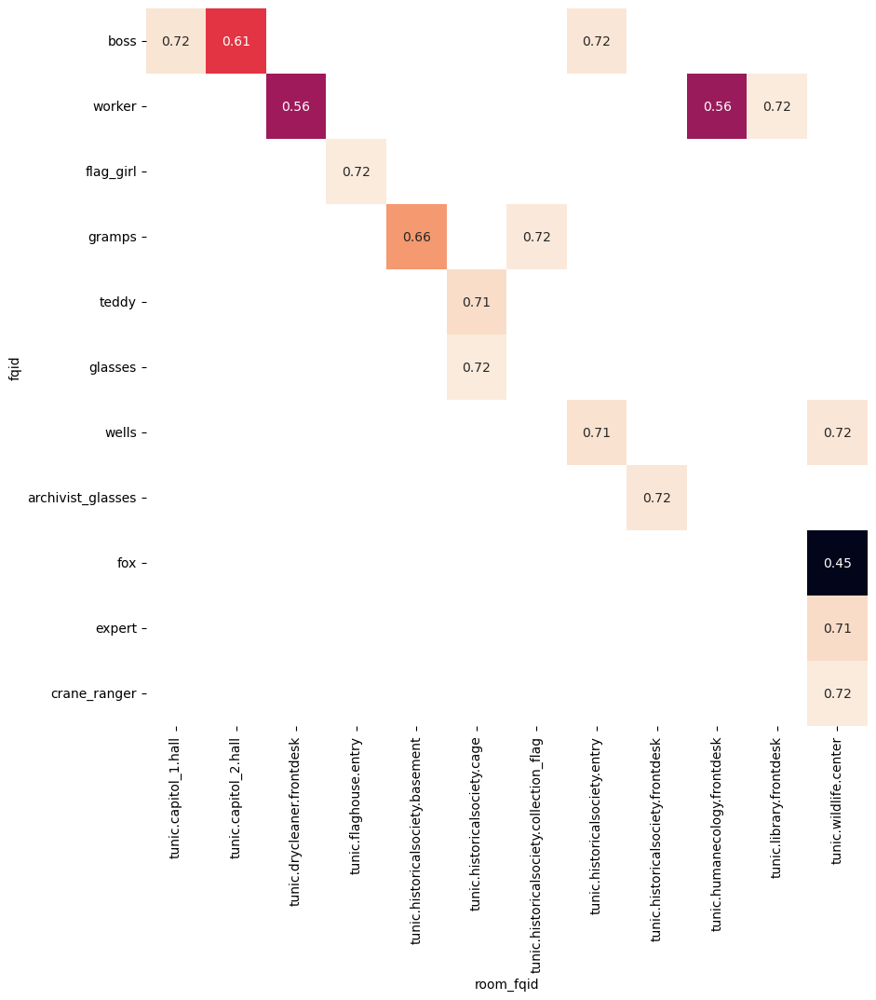

In [107]:
col_pair = ["fqid", "room_fqid"]
plot_heatmap(get_heatmap_values(df__person_click, col_pair), figsize=(10, 10))

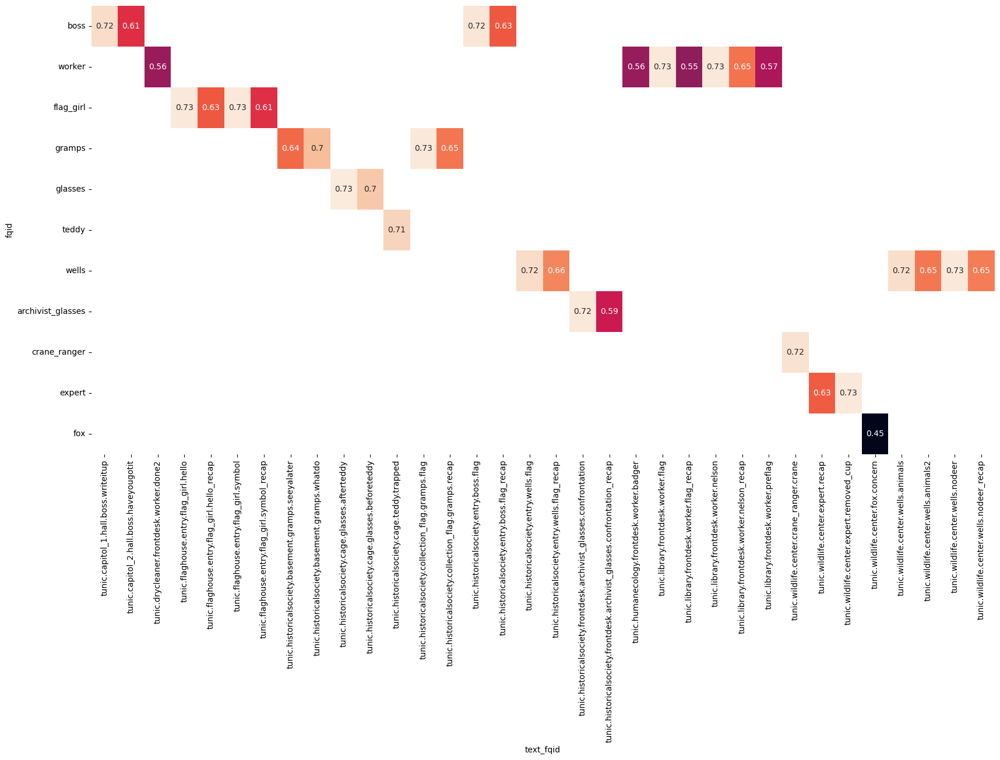

In [108]:
col_pair = ["fqid", "text_fqid"]
plot_heatmap(get_heatmap_values(df__person_click, col_pair), figsize=(20, 10))

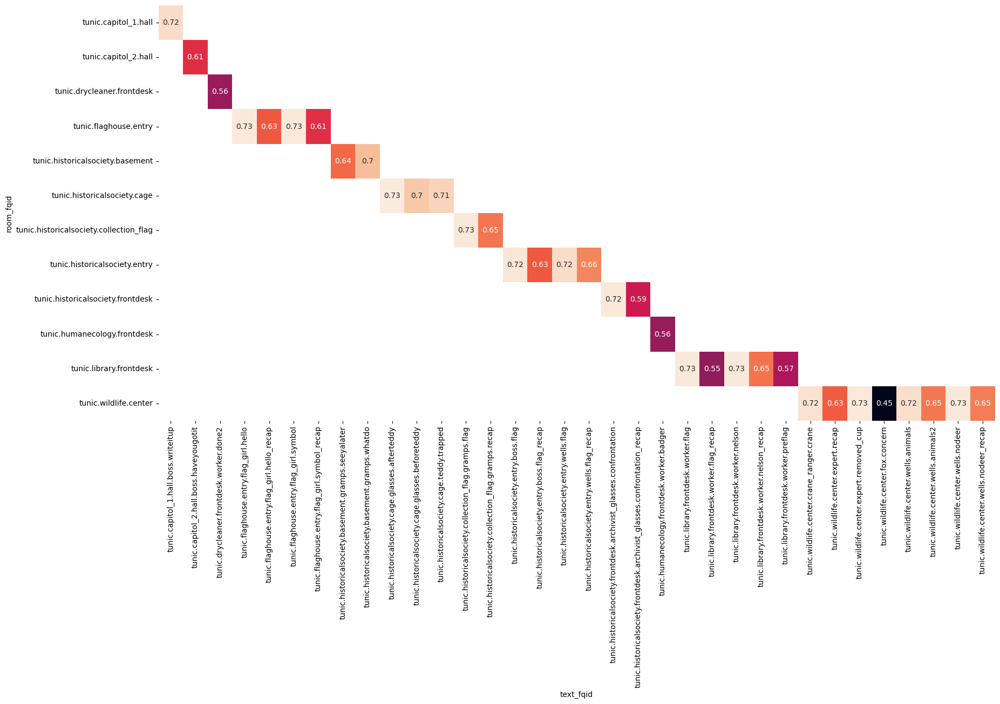

In [109]:
col_pair = ["room_fqid", "text_fqid"]
plot_heatmap(get_heatmap_values(df__person_click, col_pair), figsize=(20, 10))